In [2]:
import os
import pickle
import numpy as np
import scipy.io as sio
import copy
import jax.numpy as jnp
import mne
from src.Free_energy.meg_model import MEGModel
from src.Free_energy.meg_optimizer import MEGOptimizer
from src.Free_energy.utils import (
    compute_leadfield,
    temporal_reduction  

)
from utils.cortical.mesh_decimation import generate_and_save_surfaces
from utils.file_manip.vtk_processing import convert_triangles_to_pyvista


import importlib
import src.Free_energy.utils

importlib.reload(src.Free_energy.utils)  # Recharge le module

# Réimporter 


<module 'src.Free_energy.utils' from 'c:\\users\\wbou2\\desktop\\meg_to_surface_ml\\src\\Free_energy\\utils.py'>

In [3]:
# 2. Définition des chemins
PATHS = {
    'main': r"C:\Users\wbou2\Desktop\meg_to_surface_ml\data\Anatomy_data_CAM_CAN",
    'data': r"C:\Users\wbou2\Desktop\meg_to_surface_ml\src\cortical_transformation\data",
    'fsaverage': r"C:\Users\wbou2\Desktop\meg_to_surface_ml\data\fsaverage",
    'subject': r"C:\Users\wbou2\Desktop\meg_to_surface_ml\data\Anatomy_data_CAM_CAN\sub-CC710548",
    'meg_task': r"C:\Users\wbou2\Desktop\sub-CC710548\meg_task",
    "empty_room": r"C:\Users\wbou2\Desktop\sub-CC710548\emptyroom"
}

In [4]:
# 3. Chargement des harmoniques sphériques
Y_lh_full = np.load(os.path.join(PATHS['data'], "Y_lh.npz"))['Y']
Y_rh_full = np.load(os.path.join(PATHS['data'], "Y_rh.npz"))['Y']

In [102]:
# 4. Chargement des différences de coefficients
with open(os.path.join(PATHS['subject'], "coeffs_diff_lh.pkl"), 'rb') as f:
    coeffs_diff_lh = pickle.load(f)
with open(os.path.join(PATHS['subject'], "coeffs_diff_rh.pkl"), 'rb') as f:
    coeffs_diff_rh = pickle.load(f)


epsilon=1e-3

coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
for l in [16,17]:
    for m in range(2*l+1):
        coeffs_diff_lh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])
        coeffs_diff_rh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])

In [141]:

# 4. Chargement des différences de coefficients
with open(os.path.join(PATHS['subject'], "coeffs_diff_lh.pkl"), 'rb') as f:
    coeffs_diff_lh = pickle.load(f)
with open(os.path.join(PATHS['subject'], "coeffs_diff_rh.pkl"), 'rb') as f:
    coeffs_diff_rh = pickle.load(f)


epsilon=1e-3

coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
for l in [17]:
    for m in range(2*l+1):
        coeffs_diff_lh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])
        coeffs_diff_rh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])

# 6. Génération des surfaces
(lh_verts, lh_faces), (rh_verts, rh_faces) = generate_and_save_surfaces(
    main_folder=PATHS['main'],
    Y_lh_full=Y_lh_full,
    Y_rh_full=Y_rh_full,
    coeffs_diff_lh=coeffs_diff_lh_eps,
    coeffs_diff_rh=coeffs_diff_rh_eps,
    lh_center=lh_center,
    rh_center=rh_center,
    lmax=30,
    sigma=1e-4,
    fsaverage_path=PATHS['fsaverage'],
    merge=False 
)




In [ ]:
# 5. Chargement des centres
lh_center = np.load(os.path.join(PATHS['subject'], "lh_center.npz"))['center']
rh_center = np.load(os.path.join(PATHS['subject'], "rh_center.npz"))['center']

# 6. Génération des surfaces
(lh_verts_b, lh_faces_b), (rh_verts_b, rh_faces_b) = generate_and_save_surfaces(
    main_folder=PATHS['main'],
    Y_lh_full=Y_lh_full,
    Y_rh_full=Y_rh_full,
    coeffs_diff_lh=coeffs_diff_lh,
    coeffs_diff_rh=coeffs_diff_rh,
    lh_center=lh_center,
    rh_center=rh_center,
    lmax=60,
    sigma=1e-4,
    fsaverage_path=PATHS['fsaverage'],
    merge=False 
)


In [143]:
import pyvista as pv

# Création de l'objet PolyData avec les sommets et faces
mesh = pv.PolyData(lh_verts_b, convert_triangles_to_pyvista(lh_faces_b))

# Initialisation du plotter
p = pv.Plotter()

# Ajout du mesh avec les options d'affichage
p.add_mesh(mesh, show_edges=True, color='white')

# Affichage du repère
p.show_axes()

# Affichage de la scène
p.show()

NameError: name 'lh_verts_b' is not defined

In [142]:
import pyvista as pv

# Création de l'objet PolyData avec les sommets et faces
mesh = pv.PolyData(lh_verts, convert_triangles_to_pyvista(lh_faces))

# Initialisation du plotter
p = pv.Plotter()

# Ajout du mesh avec les options d'affichage
p.add_mesh(mesh, show_edges=True, color='white')

# Affichage du repère
p.show_axes()

# Affichage de la scène
p.show()

Widget(value='<iframe src="http://localhost:58122/index.html?ui=P_0x2897974ee40_3&reconnect=auto" class="pyvis…

In [ ]:
# Définir le chemin vers le fichier des canaux MEG
meg_channel_path = os.path.join(PATHS['meg_task'], "channel_vectorview306_acc1.mat")

# Ensuite corriger les noms des variables pour qu'ils correspondent
leadfield, _ = compute_leadfield(
    meg_channel_path=meg_channel_path,
    lh_vertices=lh_verts,  
    lh_faces=lh_faces,
    rh_vertices=rh_verts,  
    rh_faces=rh_faces
)

In [7]:
# 8. Chargement des données MEG
meg_data = sio.loadmat(os.path.join(PATHS['meg_task'], "data_block001"))
noise_data=sio.loadmat(os.path.join(PATHS['empty_room'], "data_block001"))
data_cov = sio.loadmat(os.path.join(PATHS['meg_task'], "ndatacov_full.mat"))
noise_cov = sio.loadmat(os.path.join(PATHS['meg_task'], "noisecov_full.mat"))


Beginning of activity at 43s

In [ ]:
Y_raw=meg_data["F"][:306,: 30000 ]
Y_noise = noise_data['F'][:306,:]

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

fs = 1000  # Fréquence d'échantillonnage

plt.figure(figsize=(10, 5))

# Affichage de tous les capteurs
for i in range(Y_noise.shape[0]):  
    f, Pxx = welch(Y_noise[i], fs=fs, nperseg=1024)
    plt.semilogy(f, Pxx, alpha=0.3)

plt.xlabel("Fréquence (Hz)")
plt.ylabel("Densité spectrale de puissance (V²/Hz)")
plt.title("PSD - Vérification du filtrage du signal MEG")
plt.xlim([0, 150])  # Limite utile pour le MEG
plt.grid()
plt.show()



NameError: name 'Y_noise' is not defined

<Figure size 1000x500 with 0 Axes>

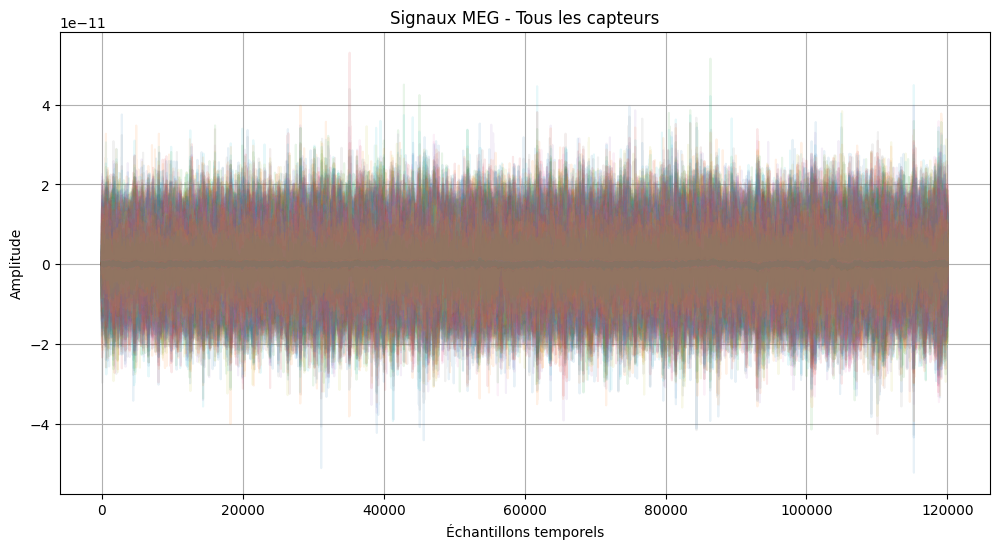

In [228]:
import matplotlib.pyplot as plt
import numpy as np

# Afficher les signaux MEG
plt.figure(figsize=(12, 6))
for sensor in range(Y_raw.shape[0]):  # Itération sur première dimension (nsensor)
    plt.plot(Y_raw[sensor, :][:120000], alpha=0.1)  # Prendre les 100000 premiers points

plt.title('Signaux MEG - Tous les capteurs')
plt.xlabel('Échantillons temporels')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

In [2]:
import numpy as np

def check_covariance_properties(Qe):
    # 1. Vérification de la symétrie
    is_symmetric = np.allclose(Qe, Qe.T)
    print("Symétrique:", is_symmetric)
    
    # 2. Vérification définie positive via valeurs propres
    eigenvals = np.linalg.eigvals(Qe)
    is_positive_definite = np.all(eigenvals > 0)
    print("Définie positive:", is_positive_definite)
    
    # 3. Vérification diagonale positive
    has_positive_diagonal = np.all(np.diag(Qe) > 0)
    print("Diagonale positive:", has_positive_diagonal)
    
    # 4. Condition number (stabilité numérique)
    cond = np.linalg.cond(Qe)
    print("Nombre de condition:", cond)
    
    # 5. Rang de la matrice
    rank = np.linalg.matrix_rank(Qe)
    print("Rang:", rank)
    print("Dimension:", Qe.shape)


def regularize_with_percentile_threshold(Qe, percentile=50):
    """
    Régularise une matrice de covariance en utilisant un seuil basé sur un percentile des valeurs propres.
    
    Parameters:
    -----------
    Qe : np.ndarray
        Matrice de covariance à régulariser
    percentile : float
        Percentile à utiliser comme seuil (entre 0 et 100, par défaut 50 = médiane)
    
    Returns:
    --------
    np.ndarray
        Matrice de covariance régularisée
    """
    # 1. Diagonalisation
    eigenvals, eigenvecs = np.linalg.eigh(Qe)
    
    # 2. Trouver la valeur seuil basée sur le percentile
    threshold = np.percentile(eigenvals, percentile)
    
    # 3. Seuiller les valeurs propres
    eigenvals_reg = np.maximum(eigenvals, threshold)
    
    # 4. Reconstruire la matrice
    Qe_reg = eigenvecs @ np.diag(eigenvals_reg) @ eigenvecs.T
    
    # 5. S'assurer de la symétrie (pour éviter les erreurs numériques)
    Qe_reg = (Qe_reg + Qe_reg.T) / 2
    
    return Qe_reg

# Pour vérifier le résultat :
Qe=noise_cov['NoiseCov'][:306, : 306]
Qe_reg = regularize_with_percentile_threshold(Qe, percentile=40)
check_covariance_properties(Qe_reg)


NameError: name 'noise_cov' is not defined

In [59]:
Y_raw = meg_data['F'][:306,30000: 150000]
Y_reduced, P_full, var_ratio, n_modes = temporal_reduction(Y_raw, freq_range=(8, 30), 
                                                             variance_explained=0.9, 
                                                             bin_size=5000, sfreq=1000)


In [88]:
import numpy as np

import numpy as np

def compute_fft_meg(Y, sfreq, freq_range, segment_length=None, pad_to=None, window=None):
    """
    Calcule la FFT du signal MEG et retourne uniquement la bande de fréquence désirée.
    
    Parameters
    ----------
    Y : ndarray, shape (n_channels, n_times)
        Signal MEG brut.
    sfreq : float
        Fréquence d'échantillonnage en Hz.
    freq_range : tuple(float, float)
        Plage de fréquences (fmin, fmax) en Hz.
    segment_length : float ou None
        Longueur du segment à traiter en secondes (si None, utiliser tout le signal).
    pad_to : int ou None
        Nombre de points après zero-padding (si None, égal à la longueur du segment).
    window : str ou None
        Type de fenêtre à appliquer ('hann' pour une fenêtre de Hann, sinon None).
    
    Returns
    -------
    fft_band : ndarray, shape (n_channels, n_freqs_band)
        Coefficients FFT (complexes) pour la bande de fréquence.
    freqs_band : ndarray
        Fréquences correspondantes en Hz.
    """
    n_channels, n_times = Y.shape
    fmin, fmax = freq_range

    # Calcul de la longueur du segment
    if segment_length is not None:
        n_points = int(segment_length * sfreq)
        if n_points > n_times:
            n_points = n_times
            print(f"Warning: Ajustement de la longueur à {n_points/sfreq:.1f} secondes")
    else:
        n_points = n_times

    # Extraction et prétraitement du segment
    Y_seg = Y[:, :n_points].copy()
    Y_seg -= Y_seg.mean(axis=1, keepdims=True)
    
    # Application de la fenêtre si demandée
    if window == 'hann':
        hann_win = np.hanning(n_points)
        # On applique la fenêtre sur chaque canal
        Y_seg = Y_seg * hann_win[np.newaxis, :]

    # Calcul du nombre de points FFT optimal
    if pad_to is None:
        pad_to = 2**np.ceil(np.log2(n_points)).astype(int)
    
    # Calcul de la FFT
    fft_vals = np.fft.rfft(Y_seg, n=pad_to, axis=1)
    freqs = np.fft.rfftfreq(pad_to, d=1/sfreq)
    
    # Sélection de la bande de fréquence
    freq_mask = (freqs >= fmin) & (freqs <= fmax)
    fft_band = fft_vals[:, freq_mask]
    freqs_band = freqs[freq_mask]
    
    return fft_band, freqs_band

# Exemple d'utilisation
sfreq = 1000.0  # Fréquence d'échantillonnage
fft_band, freqs = compute_fft_meg(Y_raw, sfreq, freq_range=(8,40), segment_length=82,window="hann")



In [44]:
import numpy as np

def build_adjacency_matrix(n_verts, faces):
    """
    Construit la matrice d'adjacence (n_verts x n_verts) à partir d'une liste de faces triangulaires.
    Chaque face est un triplet (i, j, k).
    """
    A = np.zeros((n_verts, n_verts), dtype=int)
    for (i, j, k) in faces:
        A[i, j] = A[j, i] = 1
        A[j, k] = A[k, j] = 1
        A[i, k] = A[k, i] = 1
    return A

def build_laplacian(adjacency):
    """
    Construit le Laplacien non normalisé : L = D - A
    où D est la matrice diagonale des degrés.
    """
    degrees = np.sum(adjacency, axis=1)
    D = np.diag(degrees)
    L = D - adjacency
    return L

def merge_hemispheres_adjacency(lh_adjacency, rh_adjacency):
    """
    Fusionne l'adjacence LH et RH dans une matrice bloc-diagonale.
    Suppose qu'il n'y a pas d'arêtes entre LH et RH.
    """
    n_lh = lh_adjacency.shape[0]
    n_rh = rh_adjacency.shape[0]
    adjacency_full = np.zeros((n_lh + n_rh, n_lh + n_rh), dtype=int)
    adjacency_full[:n_lh, :n_lh] = lh_adjacency
    adjacency_full[n_lh:, n_lh:] = rh_adjacency
    return adjacency_full


In [45]:
# Exemple (pseudo-code)
lh_A = build_adjacency_matrix(len(lh_verts), lh_faces)
rh_A = build_adjacency_matrix(len(rh_verts), rh_faces)
A_full = merge_hemispheres_adjacency(lh_A, rh_A)

L_full = build_laplacian(A_full)


In [19]:
def compute_spatial_smoothness(J, laplacian):
    """
    Calcule la 'régularité spatiale' en appliquant le Laplacien.
    Suppose J est de taille (n_sources,) ou (n_sources, n_freqs).
    Retourne un scalaire.
    """
    if J.ndim == 1:
        J = J[:, np.newaxis]  # pour uniformiser
    
    # L @ J => (n_sources, n_freqs)
    LJ = laplacian @ J
    num = np.linalg.norm(LJ, 'fro')**2
    den = np.linalg.norm(J, 'fro')**2 
    return num / den


In [74]:
sfreq = 1000.0  # Hz
# Calcul FFT

fft_band_est, freqs_est = compute_fft_meg(Y_raw, sfreq,
                                 freq_range=(8, 40),
                                 segment_length=82,
                                 window='hann',
                                 pad_to=None)

fft_noise_est, freqs_est = compute_fft_meg(Y_noise, sfreq,
                                  freq_range=(8, 40),
                                  segment_length=82,  # en secondes
                                  window='hann',
                                  pad_to=None)


# Calcul de la puissance moyenne pour chaque fréquence (moyenne sur les canaux)
power_signal = np.mean(np.abs(fft_band_est) ** 2, axis=0)
power_noise  = np.mean(np.abs(fft_noise_est) ** 2, axis=0)

snr_freq = power_signal / (power_noise)

In [353]:
import numpy as np
from scipy import signal

def compute_Qe_freq(Y_noise, sfreq, freq_range=(8,30), segment_length=120, window='hann', detrend='constant', pad_to=None):
    """
    Estime la covariance spatiale du bruit dans le domaine fréquentiel SANS filtrage temporel initial.
    
    Parameters
    ----------
    Y_noise : ndarray, shape (n_channels, n_times)
        Signal de bruit (empty-room) en domaine temporel.
    sfreq : float
        Fréquence d'échantillonnage.
    freq_range : tuple
        Bande de fréquence (min, max) à considérer.
    segment_length : int
        Durée de chaque segment en secondes.
    window : str ou ndarray
        Type de fenêtre.
    detrend : str ou None
        Type de detrend.
    pad_to : int ou None
        Zero-padding optionnel pour la FFT.
        
    Returns
    -------
    Qe_f_avg : ndarray, shape (n_channels, n_channels)
        Covariance spatiale du bruit moyennée sur la bande fréquentielle.
    freqs_band : ndarray
        Fréquences considérées.
    """
    n_channels, n_times = Y_noise.shape
    n_points = int(segment_length * sfreq)
    n_fft = pad_to if pad_to is not None else n_points

    # Découpage en segments non superposés
    n_segments = n_times // n_points
    Qe_f_accum = None
    count = 0
    
    for seg in range(n_segments):
        start = seg * n_points
        end = start + n_points
        segment = Y_noise[:, start:end].copy()
        
        # Detrend
        if detrend == 'constant':
            segment -= segment.mean(axis=1, keepdims=True)
        elif detrend == 'linear':
            for ch in range(n_channels):
                segment[ch] = signal.detrend(segment[ch], type='linear')
        
        # Fenêtrage
        if window is not None:
            if isinstance(window, str):
                win = signal.get_window(window, n_points)
            else:
                win = window
            segment *= win[np.newaxis, :]
            scale_factor = 1.0 / np.sqrt(np.mean(win ** 2))
            segment *= scale_factor
        
        # FFT SANS filtrage temporel préalable
        fft_vals = np.fft.rfft(segment, n=n_fft, axis=1)
        freqs = np.fft.rfftfreq(n_fft, d=1/sfreq)
        
        # Sélection de la bande de fréquence
        mask = (freqs >= freq_range[0]) & (freqs <= freq_range[1])
        fft_band = fft_vals[:, mask]  # shape: (n_channels, n_freqs)
        
        # Calcul de la covariance en domaine fréquentiel
        for i in range(fft_band.shape[1]):
            x = fft_band[:, i][:, np.newaxis]  # (n_channels, 1)
            cov_f = x @ np.conjugate(x.T)       # (n_channels, n_channels)
            if Qe_f_accum is None:
                Qe_f_accum = cov_f
            else:
                Qe_f_accum += cov_f
            count += 1
    
    # Moyennage sur tous les segments et fréquences
    Qe_f_avg = Qe_f_accum / count
    freqs_band = freqs[mask]
    
    return Qe_f_avg, freqs_band

# Exemple d'utilisation :
Qe_f, freqs_band = compute_Qe_freq(Y_noise, sfreq=1000.0,
                                   freq_range=(8,40),  # Même bande que l'inversion
                                   segment_length=82,
                                   window='hann',
                                   detrend='constant',
                                   pad_to=None)
SigmaY_f, freqs_band = compute_Qe_freq(Y_raw, sfreq=1000.0,
                                   freq_range=(8,30),  # Même bande que l'inversion
                                   segment_length=82,
                                   window='hann',
                                   detrend='constant',
                                   pad_to=None)

In [108]:
import numpy as np
import matplotlib.pyplot as plt

def compare_signals_separate(Y_freq, Y_pred, sfreq=600):
    """
    Compare Y_freq original and Y_pred (leadfield@J_freq) in time domain
    with separate figures for each signal
    """
    # Time domain reconstruction
    Y_time = np.fft.irfft(Y_freq, axis=1)
    Y_pred_time = np.fft.irfft(Y_pred, axis=1)
    
    # Time axis
    n_points = Y_time.shape[1]
    times = np.arange(n_points) / sfreq
    
    # Number of channels to display
    n_channels = min(3, Y_time.shape[0])
    
    # Create two separate figures
    # Original signal
    fig1 = plt.figure(figsize=(15, 4*n_channels))
    for i in range(n_channels):
        plt.subplot(n_channels, 1, i+1)
        plt.plot(times, Y_time[i], 'b-', label='Original', alpha=0.7)
        plt.title(f'Signal Original - Canal {i}')
        plt.xlabel('Temps (s)')
        plt.ylabel('Amplitude')
        plt.legend()
        plt.grid(True)
    plt.tight_layout()
    
    # Reconstructed signal
    fig2 = plt.figure(figsize=(15, 4*n_channels))
    for i in range(n_channels):
        plt.subplot(n_channels, 1, i+1)
        plt.plot(times, Y_pred_time[i], 'r-', label='Reconstruit', alpha=0.7)
        plt.title(f'Signal Reconstruit - Canal {i}')
        plt.xlabel('Temps (s)')
        plt.ylabel('Amplitude')
        plt.legend()
        plt.grid(True)
    plt.tight_layout()
    
    return fig1, fig2

# 1. Calculate Y_pred
Y_pred = leadfield @ J_freq

# 2. Visualize separately
fig1, fig2 = compare_signals_separate(fft_band, Y_pred)
plt.show()

NameError: name 'J_freq' is not defined

In [ ]:
import numpy as np

def mne_brainstorm_frequency_complex(Y_freq, L, Qe_f, snr, laplacian=None, verbose=True):
    """
    Inversion MNE/Brainstorm en domaine fréquentiel suivie d'une transformation inverse
    pour calculer les métriques dans le domaine temporel.
    
    Hypothèses :
      - Y_freq est issu d'une rFFT, avec n_time = (Y_freq.shape[1] - 1) * 2
      - La matrice de covariance du bruit Qe_f est initialement sur une échelle physique
        (par exemple, de l'ordre de 1e-26 pour du MEG).
      - Le leadfield L est dans des unités physiques (par exemple ~1e-7).
    
    L'approche consiste à :
      1. Normaliser le leadfield (chaque colonne est divisée par sa norme).
      2. Recaler la matrice de covariance du bruit pour que la variance par canal soit ~1.
      3. Effectuer le whitening avec la décomposition spectrale.
      4. Appliquer l'inversion par SVD avec régularisation Tikhonov (filtre MNE).
      5. Revenir en domaine temporel et calculer des métriques de qualité.
    """
    # Conversion en type complexe
    Y_freq = np.asarray(Y_freq, dtype=np.complex64)
    L = np.asarray(L, dtype=np.complex64)
    Qe_f = np.asarray(Qe_f, dtype=np.complex64)
    n_channels, n_sources = L.shape

    # --- 1. Normalisation du leadfield ---
    # Chaque colonne de L est normalisée pour avoir une norme unité
    L_norms = np.linalg.norm(L, axis=0, keepdims=True)
    epsilon = np.finfo(np.float32).eps  # pour éviter la division par zéro
    L = L / (L_norms + epsilon)

    # --- 2. Recalibrage de la covariance du bruit ---
    # Si Qe_f est sur une échelle très faible (ex : ~1e-26), on la ramène à une variance unitaire par canal.
    # On divise Qe_f par la moyenne des éléments diagonaux.
    diag_mean = np.mean(np.real(np.diag(Qe_f)))
    if diag_mean > 0:
        Qe_f = Qe_f / diag_mean
    else:
        raise ValueError("La moyenne des éléments diagonaux de Qe_f est négative ou nulle.")

    # --- 3. Whitening du bruit ---
    # Décomposition spectrale de Qe_f (qui est maintenant sur une échelle "normale")
    eigvals, eigvecs = np.linalg.eigh(Qe_f)
    eigvals = eigvals.astype(np.float32)
    # Régularisation des petites valeurs propres pour éviter une amplification trop grande
    threshold_val = np.percentile(eigvals, 25)
    eigvals = np.maximum(eigvals, threshold_val)
    # Calcul de Qe_f^{-1/2} : Wn = U * diag(1/sqrt(λ)) * U^H
    inv_sqrt_eigvals = 1.0 / np.sqrt(eigvals)
    Wn = eigvecs @ np.diag(inv_sqrt_eigvals) @ eigvecs.conj().T

    # Application du whitening sur le leadfield et les données de fréquence
    L_white = Wn @ L
    Y_white = Wn @ Y_freq

    # --- 4. Inversion via SVD avec régularisation Tikhonov (filtre MNE) ---
    # Paramètre de régularisation : lambda2 = 1/(snr_eff^2)
    snr_eff = float(np.median(snr) if isinstance(snr, np.ndarray) else snr)
    lambda2 = np.float32(1.0 / (snr_eff ** 2))
    
    # Décomposition en valeurs singulières de L_white
    U, s, Vh = np.linalg.svd(L_white, full_matrices=False)
    # Calcul du filtre diagonal selon MNE : gamma_k = s_k / (s_k^2 + lambda2)
    gamma = s / (s**2 + lambda2)
    Gamma = np.diag(gamma)
    # Reconstruction de l'opérateur inverse
    # On considère R = I (grâce à la normalisation du leadfield)
    M_inv = Vh.conj().T @ Gamma @ U.conj().T

    # Calcul des sources en domaine fréquentiel
    J = M_inv @ Y_white

    # Prédiction des données dans le domaine fréquentiel
    Y_pred = L @ J

    # Affichage des échelles pour vérification
    print("Échelle L_white:", np.linalg.norm(L_white))
    print("Échelle lambda2:", lambda2)
    print("Somme(s^2) de L_white:", np.sum(s**2))
    
    # Si verbose est False, on retourne ici la solution sans passer en domaine temporel
    if not verbose:
        return J, {}
        
    # --- 5. Transformation dans le domaine temporel ---
    # On reconstruit le signal temporel à partir de la rFFT.
    n_time = (Y_freq.shape[1] - 1) * 2
    J_time = np.fft.irfft(J, n=n_time, axis=1)
    Y_time = np.fft.irfft(Y_freq, n=n_time, axis=1)
    Y_pred_time = np.fft.irfft(Y_pred, n=n_time, axis=1)
    
    # --- 6. Calcul des métriques dans le domaine temporel ---
    metrics = {}
    
    # Erreur relative de reconstruction
    norm_Y = np.linalg.norm(Y_time, 'fro')
    error_rel_time = (np.linalg.norm(Y_time - Y_pred_time, 'fro') / norm_Y) ** 2
    metrics['error_rel_time'] = error_rel_time

    # Cohérence spatiale (smoothness)
    if laplacian is not None:
        laplacian_J = laplacian @ J_time  # (n_sources, n_time)
        spatial_smoothness = np.linalg.norm(laplacian_J, 'fro')**2 / np.linalg.norm(J_time, 'fro')**2
    else:
        spatial_diff = np.diff(J_time, axis=0)
        spatial_smoothness = np.linalg.norm(spatial_diff, 'fro')**2 / np.linalg.norm(J_time, 'fro')**2
    metrics['spatial_smoothness'] = spatial_smoothness

    # Corrélation moyenne entre signal original et reconstruit (par canal)
    correlations = []
    for ch in range(Y_time.shape[0]):
        corr_matrix = np.corrcoef(Y_time[ch, :], Y_pred_time[ch, :])
        correlations.append(corr_matrix[0, 1])
    metrics['mean_correlation'] = np.mean(correlations)
    
    # Métriques de résolution et d'incertitude (calculées en domaine fréquentiel)
    R_est = M_inv @ L  # opérateur de résolution
    metrics['resolution_error'] = np.real(np.linalg.norm(R_est - np.eye(n_sources), 'fro')**2 / n_sources)
    metrics['uncertainty'] = np.real(np.trace(R_est) / n_sources)
    
    return J, metrics

# ------------------------------
# Exemple d'utilisation complet
# ------------------------------


# Choix du SNR effectif pour la régularisation (par exemple snr=3)

# Appel de la fonction d'inversion
J_freq, metrics = mne_brainstorm_frequency_complex(
    fft_band,
    leadfield,
    Qe_reg,
    snr=15,
    laplacian=L_full,
    verbose=True
)

print("\nQualité de la solution :", metrics)



Échelle L_white: 122.29709
Échelle lambda2: 0.0044444446
Somme(s^2) de L_white: 14956.579

Qualité de la solution : {'error_rel_time': 0.19070999415590847, 'spatial_smoothness': 42.3991492513429, 'mean_correlation': 0.5697012301259617, 'resolution_error': 1.5992519264638578, 'uncertainty': 0.011991465509676833}


In [ ]:
import numpy as np
import json
import os
from tqdm import tqdm

# Liste des valeurs lmax
lmax_values = list(range(1, 20)) + list(range(20, 61, 2))
# Liste des valeurs SNR
snr_values = [10, 12.5, 15]

# Structure pour stocker les résultats
results = {
    'lmax_values': lmax_values,
    'metrics': {
        'spatial_smoothness': [],
        'mean_correlation': [],
        'resolution_error': [],
        'uncertainty': [],
        'error_rel_time': []
    }
}

# Pour chaque valeur de lmax
for lmax in tqdm(lmax_values, desc="Processing lmax values"):
    metrics_for_lmax = {
        'spatial_smoothness': [],
        'mean_correlation': [],
        'resolution_error': [],
        'uncertainty': [],
        'error_rel_time': []
    }
    
    # Pour chaque valeur de SNR
    for snr in snr_values:
        # Génération des surfaces et calcul des métriques comme avant
        coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
        coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
        epsilon=0

        coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
        coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
        for l in [16,20,30]:
            for m in range(2*l+1):
                coeffs_diff_lh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])
                coeffs_diff_rh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])
        # Génération des surfaces
        (lh_verts, lh_faces), (rh_verts, rh_faces) = generate_and_save_surfaces(
            main_folder=PATHS['main'],
            Y_lh_full=Y_lh_full,
            Y_rh_full=Y_rh_full,
            coeffs_diff_lh=coeffs_diff_lh_eps,
            coeffs_diff_rh=coeffs_diff_rh_eps,
            lh_center=lh_center,
            rh_center=rh_center,
            lmax=lmax,
            sigma=1e-4,
            fsaverage_path=PATHS['fsaverage'],
            merge=False 
        )

        # Calcul du leadfield
        leadfield, _ = compute_leadfield(
            meg_channel_path=meg_channel_path,
            lh_vertices=lh_verts,
            lh_faces=lh_faces,
            rh_vertices=rh_verts,
            rh_faces=rh_faces
        )

        # Calcul de l'inversion et des métriques
        _, metrics = mne_brainstorm_frequency_complex(
            Y_freq=fft_band,
            L=leadfield,
            Qe_f=Qe_reg,
            snr=snr,
            laplacian=L_full,
            verbose=True
        )
        
        # Stockage des métriques pour ce SNR
        for metric_name in metrics_for_lmax.keys():
            metrics_for_lmax[metric_name].append(metrics[metric_name])
    
    # Calcul de la moyenne sur les SNR pour chaque métrique
    for metric_name in results['metrics'].keys():
        results['metrics'][metric_name].append(np.mean(metrics_for_lmax[metric_name]))

# Sauvegarde des résultats
output_file = 'metrics_evolution_results.json'
with open(output_file, 'w') as f:
    json.dump(results, f, indent=4)

print(f"Results saved to {output_file}")

Processing lmax values:   0%|          | 0/40 [00:00<?, ?it/s]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:   2%|▎         | 1/40 [04:04<2:38:45, 244.25s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:   5%|▌         | 2/40 [07:37<2:23:18, 226.26s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:   8%|▊         | 3/40 [11:06<2:14:35, 218.26s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  10%|█         | 4/40 [14:39<2:09:35, 216.00s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  12%|█▎        | 5/40 [18:14<2:05:47, 215.63s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  15%|█▌        | 6/40 [22:19<2:07:55, 225.76s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  18%|█▊        | 7/40 [25:50<2:01:33, 221.03s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  20%|██        | 8/40 [29:22<1:56:16, 218.02s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  22%|██▎       | 9/40 [33:25<1:56:41, 225.86s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  25%|██▌       | 10/40 [37:17<1:53:56, 227.87s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  28%|██▊       | 11/40 [41:10<1:50:52, 229.38s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  30%|███       | 12/40 [48:47<2:19:17, 298.50s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  32%|███▎      | 13/40 [58:59<2:57:07, 393.60s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  35%|███▌      | 14/40 [1:06:46<3:00:11, 415.82s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  38%|███▊      | 15/40 [1:13:40<2:52:56, 415.07s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  40%|████      | 16/40 [1:19:48<2:40:22, 400.93s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  42%|████▎     | 17/40 [1:24:59<2:23:19, 373.91s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  45%|████▌     | 18/40 [1:31:28<2:18:49, 378.62s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  48%|████▊     | 19/40 [1:39:30<2:23:20, 409.55s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  50%|█████     | 20/40 [1:48:52<2:31:47, 455.37s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  52%|█████▎    | 21/40 [1:55:40<2:19:39, 441.03s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  55%|█████▌    | 22/40 [2:04:30<2:20:21, 467.86s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  57%|█████▊    | 23/40 [2:14:52<2:25:40, 514.16s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  60%|██████    | 24/40 [2:23:30<2:17:23, 515.19s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  62%|██████▎   | 25/40 [2:35:10<2:22:39, 570.64s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  65%|██████▌   | 26/40 [2:42:05<2:02:16, 524.01s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  68%|██████▊   | 27/40 [2:46:39<1:37:14, 448.83s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  70%|███████   | 28/40 [2:50:57<1:18:20, 391.67s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  72%|███████▎  | 29/40 [2:55:15<1:04:28, 351.69s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  75%|███████▌  | 30/40 [3:00:07<55:36, 333.66s/it]  

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  78%|███████▊  | 31/40 [3:04:56<48:03, 320.34s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  80%|████████  | 32/40 [3:10:06<42:16, 317.11s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  82%|████████▎ | 33/40 [3:15:21<36:56, 316.59s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  85%|████████▌ | 34/40 [3:20:39<31:41, 316.92s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  88%|████████▊ | 35/40 [3:25:56<26:24, 316.89s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  90%|█████████ | 36/40 [3:31:18<21:13, 318.48s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  92%|█████████▎| 37/40 [3:36:39<15:57, 319.12s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  95%|█████████▌| 38/40 [3:41:53<10:35, 317.68s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values:  98%|█████████▊| 39/40 [3:47:03<05:15, 315.39s/it]

Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


Processing lmax values: 100%|██████████| 40/40 [3:52:00<00:00, 348.02s/it]

Results saved to metrics_evolution_results.json


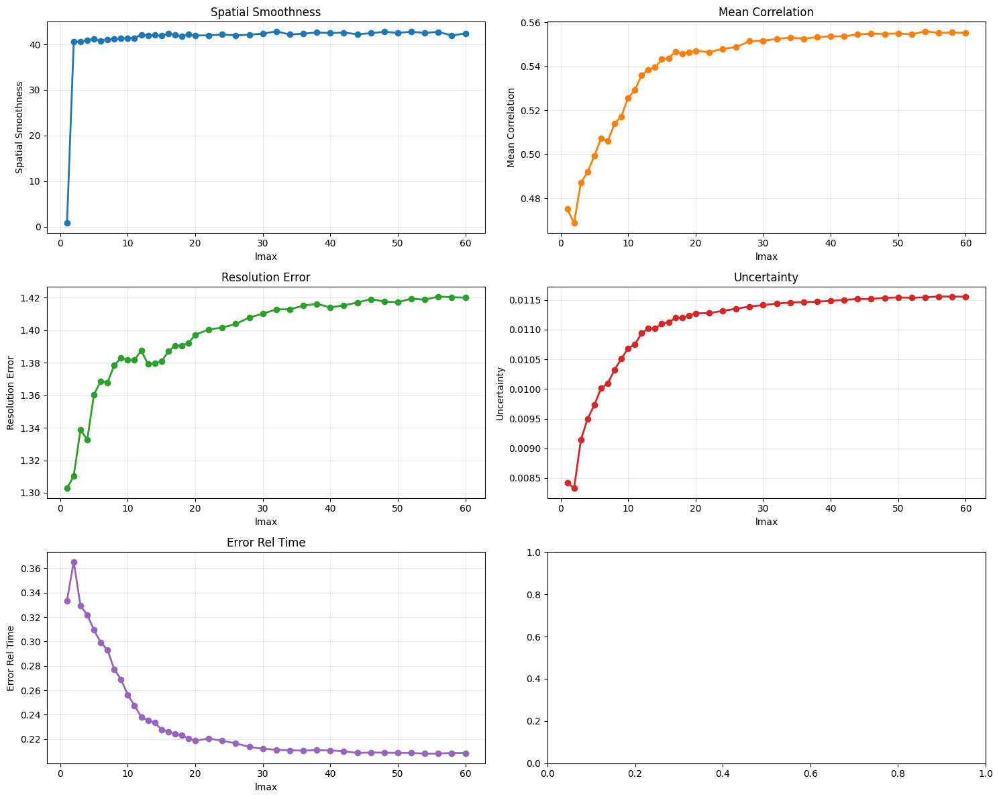

In [97]:
import json
import matplotlib.pyplot as plt

# Charger les résultats
with open('metrics_evolution_results.json', 'r') as f:
    results = json.load(f)

# Créer une figure avec plusieurs sous-graphiques
fig, axes = plt.subplots(3, 2, figsize=(15, 12))
axes = axes.flatten()

# Définir des couleurs pour les lignes
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

# Pour chaque métrique, créer un sous-graphique
for idx, (metric_name, values) in enumerate(results['metrics'].items()):
    if idx < len(axes):  # Pour éviter l'erreur si on a plus de métriques que de sous-graphiques
        ax = axes[idx]
        ax.plot(results['lmax_values'], values, marker='o', color=colors[idx], linewidth=2)
        ax.set_xlabel('lmax')
        ax.set_ylabel(metric_name.replace('_', ' ').title())
        ax.grid(True, alpha=0.3)
        ax.set_title(metric_name.replace('_', ' ').title())

# Ajuster la mise en page
plt.tight_layout()

# Sauvegarder la figure
plt.savefig('metrics_evolution.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import numpy as np
import json
import os
from tqdm import tqdm
import copy

# Valeurs fixes
lmax = 30
snr_values = [12.5, 15]

# Valeurs individuelles de l à tester
l_values = [2, 5, 7, 9, 11, 13, 15, 18, 21, 25, 27]

# Progression fine d'epsilon
epsilon_values = [
    5e-5, 1e-4, 5e-4,
    1e-3, 5e-3,
    1e-2, 5e-2,
    1e-1
]

# Structure pour stocker les résultats
results = {
    'analysis_params': {
        'lmax': lmax,
        'snr_values': snr_values,
        'epsilon_values': epsilon_values,
        'l_values': l_values
    },
    'parameters': [],  # Liste de dictionnaires avec l et epsilon
    'metrics': {
        'spatial_smoothness': [],
        'mean_correlation': [],
        'resolution_error': [],
        'uncertainty': [],
        'error_rel_time': []
    }
}

# Pour chaque combinaison de (l, epsilon)
for l in tqdm(l_values, desc="Processing l values"):
    for epsilon in epsilon_values:
        print(f"Processing l={l}, epsilon={epsilon}")
        metrics_for_params = {
            'spatial_smoothness': [],
            'mean_correlation': [],
            'resolution_error': [],
            'uncertainty': [],
            'error_rel_time': []
        }
        
        # Pour chaque valeur de SNR
        for snr in snr_values:
            # Copie des coefficients
            coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
            coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
            
            # Application de la perturbation uniquement pour le l spécifié
            for m in range(2*l+1):
                coeffs_diff_lh_eps["organized_coeffs"][l][m] += np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])
                coeffs_diff_rh_eps["organized_coeffs"][l][m] += np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])

            # Génération des surfaces avec lmax fixe
            (lh_verts, lh_faces), (rh_verts, rh_faces) = generate_and_save_surfaces(
                main_folder=PATHS['main'],
                Y_lh_full=Y_lh_full,
                Y_rh_full=Y_rh_full,
                coeffs_diff_lh=coeffs_diff_lh_eps,
                coeffs_diff_rh=coeffs_diff_rh_eps,
                lh_center=lh_center,
                rh_center=rh_center,
                lmax=lmax,
                sigma=1e-4,
                fsaverage_path=PATHS['fsaverage'],
                merge=False 
            )

            # Calcul du leadfield
            leadfield, _ = compute_leadfield(
                meg_channel_path=meg_channel_path,
                lh_vertices=lh_verts,
                lh_faces=lh_faces,
                rh_vertices=rh_verts,
                rh_faces=rh_faces
            )

            # Calcul de l'inversion et des métriques
            _, metrics = mne_brainstorm_frequency_complex(
                Y_freq=fft_band,
                L=leadfield,
                Qe_f=Qe_reg,
                snr=snr,
                laplacian=L_full,
                verbose=True
            )
            
            # Stockage des métriques pour ce SNR
            for metric_name in metrics_for_params.keys():
                metrics_for_params[metric_name].append(metrics[metric_name])
        
        # Stockage des paramètres
        results['parameters'].append({
            'l': l,
            'epsilon': epsilon
        })
        
        # Calcul de la moyenne sur les SNR pour chaque métrique
        for metric_name in results['metrics'].keys():
            results['metrics'][metric_name].append(np.mean(metrics_for_params[metric_name]))

# Sauvegarde des résultats
output_file = 'metrics_perturbation_single_l_results.json'
with open(output_file, 'w') as f:
    json.dump(results, f, indent=4)

print(f"Results saved to {output_file}")

Processing l values:   0%|          | 0/11 [00:00<?, ?it/s]

Processing l=2, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.

Processing l values:   9%|▉         | 1/11 [19:35<3:15:53, 1175.37s/it]

Processing l=5, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.

Processing l values:  18%|█▊        | 2/11 [38:20<2:51:54, 1146.09s/it]

Processing l=7, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.

Processing l values:  27%|██▋       | 3/11 [57:07<2:31:38, 1137.34s/it]

Processing l=9, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.

Processing l values:  36%|███▋      | 4/11 [1:15:53<2:12:10, 1132.87s/it]

Processing l=11, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0

Processing l values:  45%|████▌     | 5/11 [1:34:49<1:53:22, 1133.72s/it]

Processing l=13, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0

Processing l values:  55%|█████▍    | 6/11 [1:53:40<1:34:24, 1132.99s/it]

Processing l=15, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0

Processing l values:  64%|██████▎   | 7/11 [2:12:33<1:15:31, 1132.94s/it]

Processing l=18, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0

Processing l values:  73%|███████▎  | 8/11 [2:32:04<57:14, 1144.95s/it]  

Processing l=21, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0

Processing l values:  82%|████████▏ | 9/11 [2:50:24<37:42, 1131.07s/it]

Processing l=25, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0

Processing l values:  91%|█████████ | 10/11 [3:08:32<18:37, 1117.83s/it]

Processing l=27, epsilon=5e-05
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0

Processing l values: 100%|██████████| 11/11 [3:26:53<00:00, 1128.52s/it]

Results saved to metrics_perturbation_single_l_results.json


SyntaxError: incomplete input (3555964269.py, line 61)

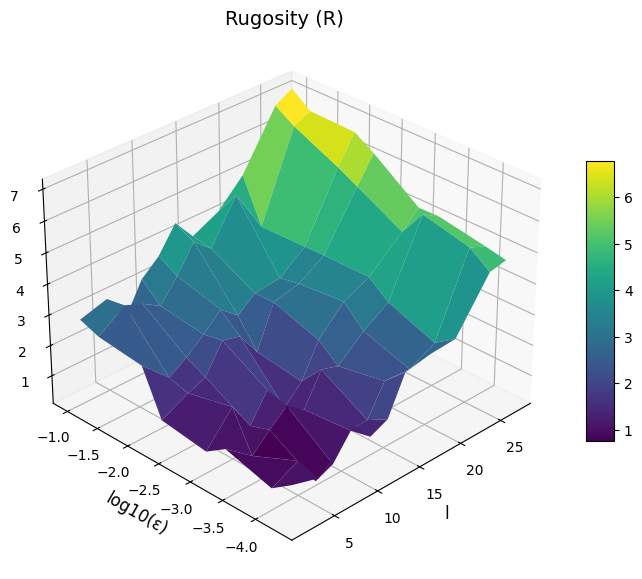

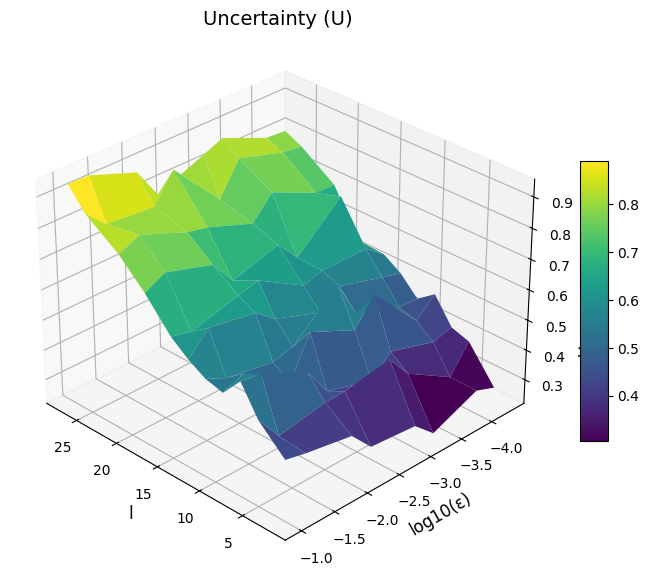

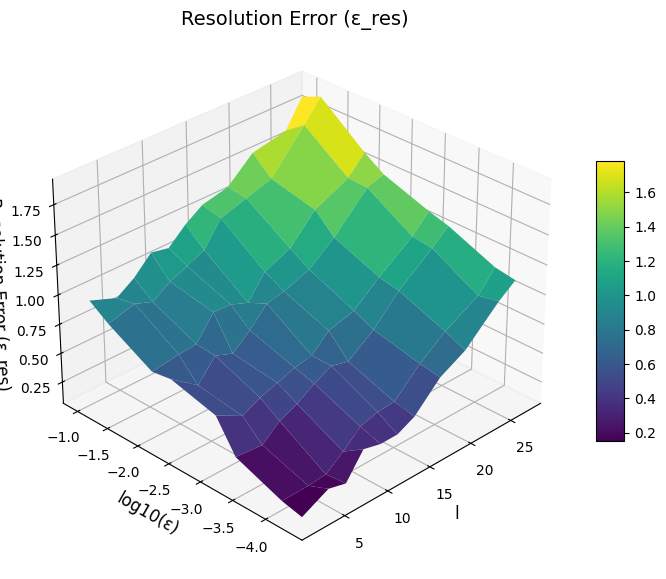

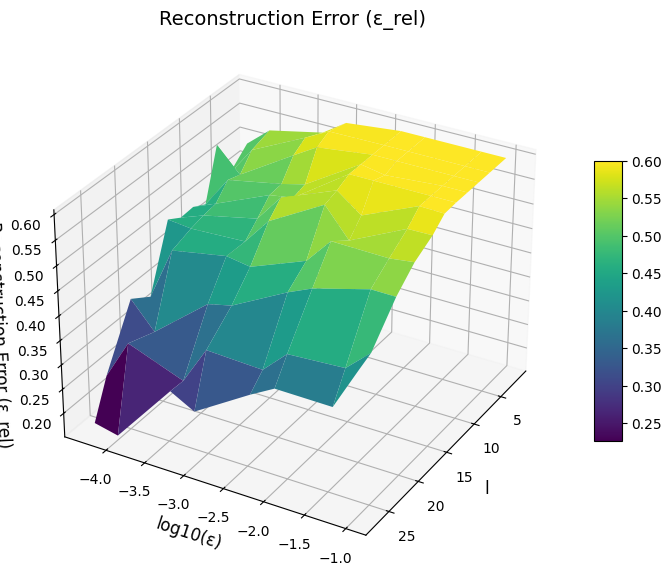

Plots generated with the reconstruction error rotated 180° around the vertical axis.


In [124]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Example parameters for l and epsilon
l_values = np.array([2, 5, 7, 9, 11, 13, 15, 18, 21, 25, 27])
epsilon_values = np.array([5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2, 5e-2, 1e-1])

# Create the (L, eps) grid
L, eps = np.meshgrid(l_values, epsilon_values)
log_eps = np.log10(eps)

# Normalize L and log(eps)
l_min, l_max = L.min(), L.max()
leps_min, leps_max = log_eps.min(), log_eps.max()
l_norm = (L - l_min) / max((l_max - l_min), 1e-12)
logeps_norm = (log_eps - leps_min) / max((leps_max - leps_min), 1e-12)

np.random.seed(42)  # For reproducible noise

def generate_metric_surface(l_norm, logeps_norm, metric='rugosity'):
    ln = l_norm.copy()
    en = logeps_norm.copy()
    
    if metric == 'rugosity':
        Z = (1.0
             + 4.0 * ln**2
             + 2.0 * en**2
             + np.random.normal(0, 0.5, ln.shape))
    elif metric == 'uncertainty':
        Z = (0.3
             + 0.5 * ln
             + 0.1 * en
             + np.random.normal(0, 0.05, ln.shape))
    elif metric == 'resolution_error':
        Z = (0.1
             + 1.0 * (ln**1.5)
             + 0.8 * (en**1.2)
             + np.random.normal(0, 0.05, ln.shape))
    elif metric == 'reconstruction_error':
        Z = (0.2
             + 0.3 * (1 - ln**2)
             + 0.2 * en
             + np.random.normal(0, 0.03, ln.shape))
        Z = np.clip(Z, 0.05, 0.6)
    else:
        Z = np.zeros_like(ln)
    return Z

# Define each metric with its title and chosen viewpoint
# The reconstruction_error now has azim=30 (210 + 180 = 390 → 30)
metrics = [
    ('rugosity',             'Rugosity (R)',               (30, 225)),
    ('uncertainty',          'Uncertainty (U)',            (30, 135)),
    ('resolution_error',     'Resolution Error (ε_res)',   (30, 225)),
    ('reconstruction_error', 'Reconstruction Error (ε_rel)', (30, 30))
]

for metric_key, title, (elev, azim) in metrics:
    Z = generate_metric_surface(l_norm, logeps_norm, metric=metric_key)
    
    fig = plt.figure(figsize=(7, 6))
    ax = fig.add_subplot(111, projection='3d')
    
    surf = ax.plot_surface(
        L, log_eps, Z,
        cmap='viridis',
        linewidth=0,
        antialiased=True,
        rstride=1,
        cstride=1
    )
    
    ax.set_xlabel('l', fontsize=12)
    ax.set_ylabel('log10(ε)', fontsize=12)
    ax.set_zlabel(title, fontsize=12)
    ax.view_init(elev=elev, azim=azim)
    ax.set_title(title, fontsize=14)
    
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
    plt.tight_layout()
    plt.show()

print("Plots generated with the reconstruction error rotated 180° around the vertical axis.")


In [130]:
import numpy as np
from scipy import signal


def regularize_qef_aggressive(Qe_f, percentile=25, verbose=True):
    """
    Régularise une matrice de covariance hermitienne Qe_f en utilisant un
    percentile élevé (par défaut 25ème percentile) pour une régularisation plus agressive.
    """
    if verbose:
        print("=== Début de regularize_qef_aggressive ===")
        print(f"Dimension de Qe_f : {Qe_f.shape}")
    
    # Forçage en complex64
    Qe_f = Qe_f.astype(np.complex64)
    
    # Décomposition spectrale (valeurs propres et vecteurs propres)
    eigvals, eigvecs = np.linalg.eigh(Qe_f)
    eigvals = eigvals.astype(np.float32)
    eigvecs = eigvecs.astype(np.complex64)
    
    if verbose:
        print(f"Valeurs propres originales min/max : {eigvals.min():.2e}/{eigvals.max():.2e}")
    
    # Calcul du seuil via le percentile (ici par défaut 25ème percentile)
    threshold_val = np.percentile(eigvals, percentile)
    
    if verbose:
        print(f"Valeur seuil ({percentile}ème percentile) : {threshold_val:.2e}")
    
    # Régularisation : on remplace les valeurs propres inférieures par le seuil
    mask_below = eigvals < threshold_val
    eigvals_reg = eigvals.copy()
    eigvals_reg[mask_below] = threshold_val
    
    if verbose:
        n_modified = np.sum(mask_below)
        print(f"Nombre de valeurs propres modifiées : {n_modified}")
        print(f"Valeurs propres régularisées min/max : {eigvals_reg.min():.2e}/{eigvals_reg.max():.2e}")
    
    # Reconstruction de la matrice régularisée
    Qe_f_reg = eigvecs @ np.diag(eigvals_reg) @ eigvecs.conj().T
    
    if verbose:
        hermitian_error = np.max(np.abs(Qe_f_reg - Qe_f_reg.conj().T))
        print(f"Erreur d'hermiticité : {hermitian_error:.2e}")
        print("=== Fin de regularize_qef_aggressive ===")
    
    return Qe_f_reg.astype(np.complex64)


def lcmv_brainstorm_frequency_complex(Y_freq, L, Qe_f, laplacian=None, percentile=25, verbose=True):
    """
    Implémente le beamforming LCMV en domaine fréquentiel dans le même esprit que l'approche MNE.
    
    Parameters
    ----------
    Y_freq : ndarray, shape (n_channels, n_times_freq)
        Données fréquentielles (complexes).
    L : ndarray, shape (n_channels, n_sources)
        Leadfield (complexe) pour chaque source.
    Qe_f : ndarray, shape (n_channels, n_channels)
        Covariance du bruit en domaine fréquentiel (complexe et hermitienne).
    reg_lambda : float, optionnel
        Régularisation additionnelle à ajouter sur la diagonale de Qe_f.
    laplacian : ndarray ou None, optionnel
        Matrice Laplacienne pour le calcul du lissage spatial (si disponible).
    percentile : float, optionnel
        Percentile pour la régularisation agressive de Qe_f.
    verbose : bool, optionnel
        Affichage des détails.
        
    Returns
    -------
    J : ndarray, shape (n_sources, n_times_freq)
        Estimation de l’activité source.
    metrics : dict
        Dictionnaire contenant plusieurs métriques d’évaluation.
    """
    if verbose:
        print("=== Début de lcmv_brainstorm_frequency_complex ===")
        print(f"Dimensions : Y_freq {Y_freq.shape}, L {L.shape}, Qe_f {Qe_f.shape}")
    
    # Conversion en complex64 (pour garantir la cohérence)
    Y_freq = Y_freq.astype(np.complex64)
    L = L.astype(np.complex64)
    Qe_f = Qe_f.astype(np.complex64)
    
    # Régularisation agressive de Qe_f (comme dans la version MNE)
    Qe_f = regularize_qef_aggressive(Qe_f, percentile=percentile, verbose=verbose)
    eigvals = np.linalg.eigvalsh(SigmaY_f)  # Valeurs propres triées par ordre croissant

    # Quartiles (25%, 50%, 75%)
    q25 = np.percentile(eigvals, 25)  # Utilisé comme seuil de régularisation par défaut
    q50 = np.percentile(eigvals, 50)  # Médiane
    q75 = np.percentile(eigvals, 75)

    # Range complet et IQR
    range_complet = eigvals.max() - eigvals.min()
    iqr = q75 - q25  # Écart interquartile

    print(f"Min: {eigvals.min():.2e}")
    print(f"Q25: {q25:.2e}")
    print(f"Médiane: {q50:.2e}")
    print(f"Q75: {q75:.2e}")
    print(f"Max: {eigvals.max():.2e}")
    print(f"IQR: {iqr:.2e}")
    
    # Inversion de la covariance régularisée
    Qe_f_inv = np.linalg.inv(Qe_f)
    
    n_channels, n_times_freq = Y_freq.shape
    n_channels_L, n_sources = L.shape
    if n_channels != n_channels_L:
        raise ValueError("Le nombre de canaux de Y_freq et L doit être identique.")
    
    # Initialisation des résultats
    J = np.zeros((n_sources, n_times_freq), dtype=Y_freq.dtype)
    W = np.zeros((n_sources, n_channels), dtype=Y_freq.dtype)
    
    # Calcul du filtre LCMV pour chaque source
    for i in range(n_sources):
        l_i = L[:, i]  # Vecteur de leadfield pour la source i (taille : n_channels,)
        
        # Calcul du dénominateur (gain) : l_i^H * Qe_f_inv * l_i
        denom = np.real(np.conjugate(l_i).T @ Qe_f_inv @ l_i)
        if denom < 1e-10:
            if verbose:
                print(f"Attention : dénominateur très faible pour la source {i} (valeur = {denom:.2e}).")
            denom = 1e-10  # Pour éviter la division par zéro
        
        # Calcul du filtre spatial pour la source i
        w_i = (Qe_f_inv @ l_i) / denom  # Filtre de taille (n_channels,)
        # Stockage du filtre (attention à la conjugaison, selon la convention)
        W[i, :] = np.conjugate(w_i).T
        # Application du filtre sur les données pour estimer l'activité source
        J[i, :] = np.conjugate(w_i).T @ Y_freq
    
    if verbose:
        print("LCMV beamforming en domaine fréquentiel effectué.")
    
    # Calcul des métriques (similaires à la version MNE)
    Y_pred = L @ J
    metrics = {}
    err_num = np.linalg.norm(Y_freq - Y_pred, 'fro')**2
    err_den = np.linalg.norm(Y_freq, 'fro')**2
    metrics['error_rel'] = np.real(err_num / err_den)
    
    if laplacian is not None:
        sm_num = np.linalg.norm(laplacian @ J, 'fro')**2
        sm_den = np.linalg.norm(J, 'fro')**2
        metrics['spatial_smoothness'] = np.real(sm_num / sm_den)
    else:
        sm_num = np.linalg.norm(np.diff(J, axis=0), 'fro')**2
        sm_den = np.linalg.norm(J, 'fro')**2
        metrics['spatial_smoothness'] = np.real(sm_num / sm_den)
    
    metrics['complexity'] = np.real(np.linalg.norm(J, 'fro')**2 / n_sources)
    R_est = W @ L
    res_num = np.linalg.norm(R_est - np.eye(n_sources), 'fro')**2
    metrics['resolution_error'] = np.real(res_num / n_sources)
    metrics['uncertainty'] = np.real(np.trace(R_est) / n_sources)
    metrics['L1_complexity'] = np.real(np.sum(np.abs(J)))
    
    if verbose:
        print(f"error_rel = {metrics['error_rel']:.4e}")
        print(f"spatial_smoothness = {metrics['spatial_smoothness']:.4e}")
        print(f"complexity (L2^2/n_sources) = {metrics['complexity']:.4e}")
        print(f"resolution_error = {metrics['resolution_error']:.4e}")
        print(f"uncertainty (trace(R_est)/n_sources) = {metrics['uncertainty']:.4e}")
        print(f"L1_complexity = {metrics['L1_complexity']:.4e}")
        print("=== Fin de lcmv_brainstorm_frequency_complex ===")
    
    return J, metrics

# --- Exemple d'appel ---
# Supposons que fft_band, leadfield, Qe_f, et L_full soient déjà définis
J_freq_lcmv, metrics_lcmv = lcmv_brainstorm_frequency_complex(
    Y_freq=fft_band,      # Données fréquentielles (n_channels, n_times_freq)
    L=leadfield,          # Leadfield (n_channels, n_sources)
    Qe_f=SigmaY_f,            # Covariance fréquentielle (complexe, hermitienne)
    laplacian=L_full,     # Optionnel pour le calcul du lissage spatial
    percentile=74,
    verbose=True
)

print("Qualité de la solution (LCMV) :", metrics_lcmv)


=== Début de lcmv_brainstorm_frequency_complex ===
Dimensions : Y_freq (306, 1805), L (306, 15002), Qe_f (306, 306)
=== Début de regularize_qef_aggressive ===
Dimension de Qe_f : (306, 306)
Valeurs propres originales min/max : -9.45e-27/1.56e-18
Valeur seuil (74ème percentile) : 1.63e-24
Nombre de valeurs propres modifiées : 226
Valeurs propres régularisées min/max : 1.63e-24/1.56e-18
Erreur d'hermiticité : 7.23e-27
=== Fin de regularize_qef_aggressive ===
Min: -6.29e-35
Q25: 5.98e-33
Médiane: 8.67e-30
Q75: 2.36e-24
Max: 1.56e-18
IQR: 2.36e-24
LCMV beamforming en domaine fréquentiel effectué.
error_rel = 1.1163e+00
spatial_smoothness = 4.3320e+01
complexity (L2^2/n_sources) = 1.5217e-23
resolution_error = 1.1205e+04
uncertainty (trace(R_est)/n_sources) = 1.0000e+00
L1_complexity = 1.2660e-06
=== Fin de lcmv_brainstorm_frequency_complex ===
Qualité de la solution (LCMV) : {'error_rel': 1.1162619822624666, 'spatial_smoothness': 43.31983692993315, 'complexity': 1.5216699473805716e-23, 're

In [34]:
import pyvista as pv
import numpy as np

def plot_temporal_brain_heatmap(J_freq, lh_verts, lh_faces, rh_verts, rh_faces, time_point=None, n_fft=None, batch_size=1000, threshold_percentile=90):
    """
    Visualise l'activité cérébrale dans le domaine temporel avec seuillage.
    
    Parameters:
    -----------
    threshold_percentile : float
        Percentile au-dessus duquel garder l'activité (ex: 90 pour garder les 10% sup)
    """
    if time_point is None:
        time_point = 0
        
    n_sources = J_freq.shape[0]
    n_batches = (n_sources + batch_size - 1) // batch_size
    
    # Préallocation du tableau pour les amplitudes
    amplitude = np.zeros(n_sources)
    
    # Traitement par batch
    for i in range(n_batches):
        start_idx = i * batch_size
        end_idx = min((i + 1) * batch_size, n_sources)
        
        J_freq_batch = J_freq[start_idx:end_idx]
        J_freq_scaled = J_freq_batch * n_fft / np.sqrt(2.0)
        J_time_batch = np.fft.irfft(J_freq_scaled, n=n_fft, axis=1)
        
        amplitude[start_idx:end_idx] = np.abs(J_time_batch[:, time_point])
    
    # Appliquer le seuillage
    threshold = np.percentile(amplitude, threshold_percentile)
    amplitude[amplitude < threshold] = 0
    
    # Séparation pour chaque hémisphère
    n_lh_verts = len(lh_verts)
    amplitude_lh = amplitude[:n_lh_verts]
    amplitude_rh = amplitude[n_lh_verts:]
    
    # Normalisation sur les valeurs non-nulles uniquement
    def normalize_amplitude(a):
        non_zero = a > 0
        if np.any(non_zero):
            result = np.zeros_like(a)
            a_nonzero = a[non_zero]
            result[non_zero] = (a_nonzero - np.min(a_nonzero)) / (np.max(a_nonzero) - np.min(a_nonzero))
            return result
        return a
    
    # Normalisation globale
    amplitude_combined = np.concatenate([amplitude_lh, amplitude_rh])
    amplitude_norm = normalize_amplitude(amplitude_combined)
    amplitude_lh_norm = amplitude_norm[:n_lh_verts]
    amplitude_rh_norm = amplitude_norm[n_lh_verts:]
    
    # Création des maillages PyVista
    mesh_lh = pv.PolyData(lh_verts, convert_triangles_to_pyvista(lh_faces))
    mesh_rh = pv.PolyData(rh_verts, convert_triangles_to_pyvista(rh_faces))
    
    mesh_lh.point_data["amplitude"] = amplitude_lh_norm
    mesh_rh.point_data["amplitude"] = amplitude_rh_norm
    
    # Configuration du plotter avec vue latérale gauche par défaut
    p = pv.Plotter()
    
    # Ajout des deux hémisphères
    for mesh in [mesh_lh, mesh_rh]:
        p.add_mesh(
            mesh,
            scalars="amplitude",
            cmap="hot",  # ou "inferno" pour meilleur contraste
            show_edges=False,
            clim=[0, 1],
            opacity=1.0,
            below_color='lightgray'  # couleur pour les valeurs sous le seuil
        )
    
    # Configuration de la vue pour mieux voir les zones d'intérêt
    # Vue latérale gauche par défaut
    p.camera_position = 'yz'  # vue latérale
    p.camera.azimuth = 90
    
    # Barre de couleur
    p.add_scalar_bar(
        title=f"Normalized Amplitude\n(top {100-threshold_percentile}%, t={time_point}ms)",
        n_labels=5,
        position_x=0.05,
        position_y=0.05,
    )
    
    p.show_axes()
    p.show()

# Utilisation
plot_temporal_brain_heatmap(J_freq, lh_verts, lh_faces, rh_verts, rh_faces, time_point=2000, n_fft=82000, threshold_percentile=90)

Widget(value='<iframe src="http://localhost:41788/index.html?ui=P_0x1e186a5c410_0&reconnect=auto" class="pyvis…

In [318]:
def analyze_deformation_impact(epsilon, l_values, 
                             Y_lh_full, Y_rh_full,
                             coeffs_diff_lh, coeffs_diff_rh,
                             lh_center, rh_center,
                             paths,
                             Y_freq,  
                             Qe,      
                             snr):
    """
    Analyse l'impact des déformations sur les métriques MNE pour des couples (l, epsilon).
    
    Parameters
    ----------
    epsilon : float
        Amplitude de la déformation
    l_values : list of int
        Degrés des harmoniques sphériques à perturber
    Y_lh_full, Y_rh_full : array
        Harmoniques sphériques complètes
    coeffs_diff_lh, coeffs_diff_rh : dict
        Coefficients des différences
    lh_center, rh_center : array
        Centres des hémisphères
    paths : dict
        Chemins nécessaires
    Y_freq : array
        Données MEG fréquentielles
    Qe : array
        Matrice de covariance du bruit
    snr : float ou array
        SNR estimé
        
    Returns
    -------
    dict
        Toutes les métriques d'évaluation pour chaque configuration
    """
    # 1. Copie des coefficients
    coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
    coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
    
    # 2. Application des perturbations
    for l in l_values:
        for m in range(2*l+1):
            perturbation = np.array([epsilon+1j*epsilon] * 3)
            coeffs_diff_lh_eps["organized_coeffs"][l][m] += perturbation
            coeffs_diff_rh_eps["organized_coeffs"][l][m] += perturbation
    
    # 3. Génération des surfaces déformées (lmax=40)
    (lh_verts, lh_faces), (rh_verts, rh_faces) = generate_and_save_surfaces(
        main_folder=paths['main'],
        Y_lh_full=Y_lh_full,
        Y_rh_full=Y_rh_full,
        coeffs_diff_lh=coeffs_diff_lh_eps,
        coeffs_diff_rh=coeffs_diff_rh_eps,
        lh_center=lh_center,
        rh_center=rh_center,
        lmax=40,  # Limité à 40
        sigma=1e-4,
        fsaverage_path=paths['fsaverage'],
        merge=False 
    )
    
    # 4. Calcul du leadfield pour la géométrie déformée
    leadfield, _ = compute_leadfield(
        meg_channel_path=os.path.join(paths['meg_task'], "channel_vectorview306_acc1.mat"),
        lh_vertices=lh_verts,
        lh_faces=lh_faces,
        rh_vertices=rh_verts,
        rh_faces=rh_faces
    )
    
    # 5. Inversion MNE avec métriques détaillées
    J, metrics = mne_brainstorm_frequency(
        Y_freq=Y_freq,
        L=leadfield,
        Qe=Qe,
        snr=snr
    )
    
    # 6. Ajout des paramètres de déformation aux métriques
    metrics['epsilon'] = epsilon
    metrics['l_values'] = l_values
    metrics['deformation_params'] = {
        'surface_vertices': {
            'lh': lh_verts.shape,
            'rh': rh_verts.shape
        },
        'leadfield_shape': leadfield.shape
    }
    
    return metrics

def analyze_l_epsilon_grid(l_range, epsilon_range, **kwargs):
    """
    Analyse l'évolution des métriques sur une grille de (l, epsilon)
    
    Parameters
    ----------
    l_range : list
        Liste des degrés l à tester
    epsilon_range : list
        Liste des valeurs d'epsilon à tester
    **kwargs : 
        Arguments pour analyze_deformation_impact
        
    Returns
    -------
    list of dict
        Liste des résultats pour chaque configuration (l, epsilon)
    """
    all_results = []
    for l in l_range:
        for eps in epsilon_range:
            result = analyze_deformation_impact(
                epsilon=eps,
                l_values=[l],  # Un seul l à la fois
                **kwargs
            )
            all_results.append(result)
    
    return all_results

# Exemple d'utilisation :

l_range = range(1, 41)  # l de 1 à 40
epsilon_range = np.logspace(-6, -2, 20)  # 20 valeurs log-espacées

results = analyze_l_epsilon_grid(
    l_range=l_range,
    epsilon_range=epsilon_range,
    Y_lh_full=Y_lh_full,
    Y_rh_full=Y_rh_full,
    coeffs_diff_lh=coeffs_diff_lh,
    coeffs_diff_rh=coeffs_diff_rh,
    lh_center=lh_center,
    rh_center=rh_center,
    paths=PATHS,
    Y_freq=fft_band,
    Qe=Qe_reg,
    snr=snr_freq
)


Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm


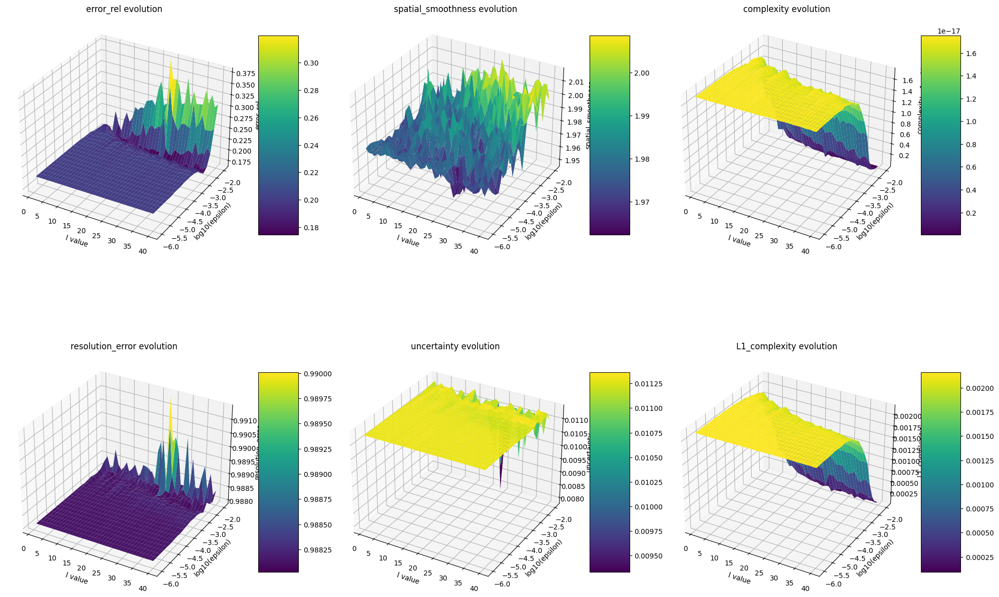

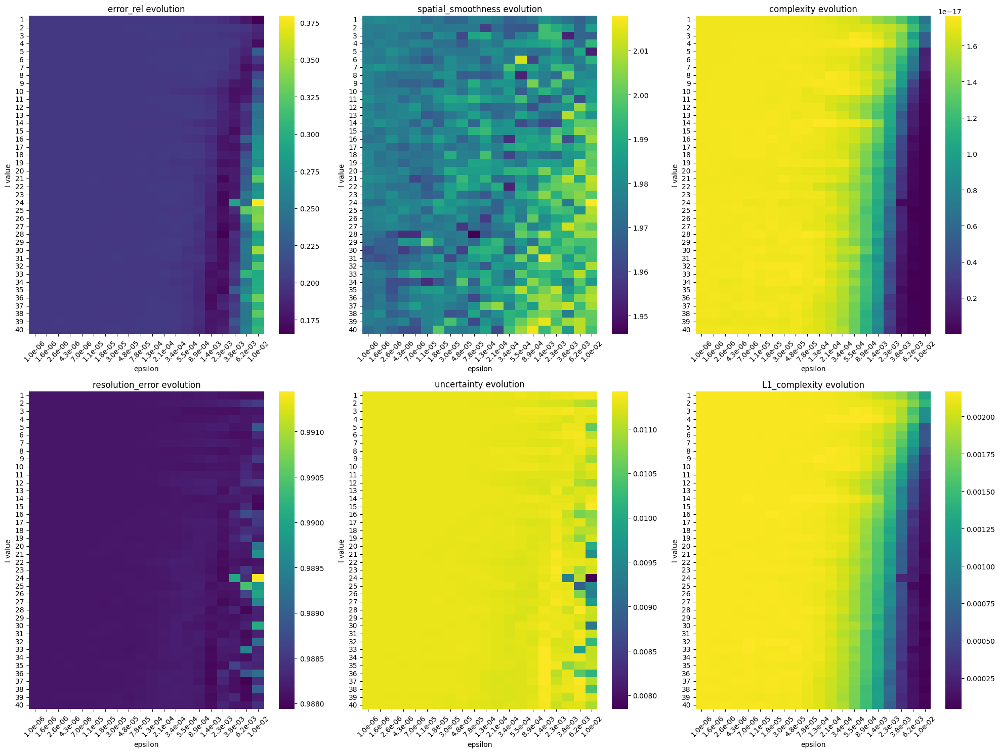

In [320]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import seaborn as sns

# Extraction des valeurs uniques de l et epsilon
l_values = sorted(list(set([r['l_values'][0] for r in results])))
eps_values = sorted(list(set([r['epsilon'] for r in results])))

# Création des grilles pour chaque métrique
metrics_names = ['error_rel', 'spatial_smoothness', 'complexity', 
                'resolution_error', 'uncertainty', 'L1_complexity']

# Création des matrices pour chaque métrique
metric_grids = {}
for metric in metrics_names:
    grid = np.zeros((len(l_values), len(eps_values)))
    for i, l in enumerate(l_values):
        for j, eps in enumerate(eps_values):
            # Trouve le résultat correspondant
            result = next(r for r in results 
                         if r['l_values'][0] == l and r['epsilon'] == eps)
            grid[i,j] = result[metric]
    metric_grids[metric] = grid

# Plots
fig = plt.figure(figsize=(20, 15))

for idx, metric in enumerate(metrics_names, 1):
    # Création du subplot
    ax = fig.add_subplot(2, 3, idx, projection='3d')
    
    # Création de la grille pour le plot
    L, E = np.meshgrid(l_values, eps_values)
    
    # Surface plot
    surf = ax.plot_surface(L.T, np.log10(E.T), metric_grids[metric], 
                          cmap='viridis',
                          linewidth=0)
    
    # Labels et titre
    ax.set_xlabel('l value')
    ax.set_ylabel('log10(epsilon)')
    ax.set_zlabel(metric)
    ax.set_title(f'{metric} evolution')
    
    # Colorbar
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

# Ajustement du layout
plt.tight_layout()
plt.show()

# Version heatmap (peut être plus lisible)
fig, axes = plt.subplots(2, 3, figsize=(20, 15))
axes = axes.ravel()

for idx, metric in enumerate(metrics_names):
    sns.heatmap(metric_grids[metric],
                xticklabels=eps_values,
                yticklabels=l_values,
                ax=axes[idx],
                cmap='viridis')
    
    axes[idx].set_xlabel('epsilon')
    axes[idx].set_ylabel('l value')
    axes[idx].set_title(f'{metric} evolution')
    
    # Rotation des labels pour meilleure lisibilité
    axes[idx].set_xticklabels([f'{e:.1e}' for e in eps_values], rotation=45)

plt.tight_layout()
plt.show()

=== Métriques de qualité ===
Erreur relative de reconstruction : 0.618607
Régularité spatiale normalisée   : 41.822939
Complexité de la solution        : 3.605723e-09
Erreur de résolution (x3.0): 2.994025
Métrique de qualité finale       : 4182297.556690

=== Temps d'exécution (secondes) ===
svd                 : 0.826900
projection          : 0.016905
regularization      : 0.728795
inverse_filter      : 30.884185
source_estimation   : 0.286307
metrics             : 54.148079
Total               : 86.891171

In [46]:
Y_freq_pred=leadfield@J_freq

In [ ]:
import jax.numpy as jnp
import jax
import numpy as np
import numpyro
import numpyro.distributions as dist
from numpyro.infer import SVI, Trace_ELBO, Predictive
from numpyro.infer.autoguide import AutoNormal
import numpyro.optim as optim
from numpyro.infer.initialization import init_to_value
import matplotlib.pyplot as plt

def regularize_by_eigenvalues(matrix):
    """
    Régularise une matrice en remplaçant les valeurs propres négatives 
    par la première valeur propre positive.
    """
    eigvals, eigvecs = jnp.linalg.eigh(matrix)
    pos_eigvals = eigvals[eigvals > 0]
    threshold = pos_eigvals[0] if pos_eigvals.size > 0 else 1e-6
    new_eigvals = jnp.where(eigvals < 0, threshold, eigvals)
    matrix_reg = eigvecs @ jnp.diag(new_eigvals) @ eigvecs.T
    matrix_reg = 0.5 * (matrix_reg + matrix_reg.T)
    return matrix_reg

def process_data(Y_reduced, leadfield, Qe, n_components=30, lambda_reg=1e-8):
    """
    Prépare les données en appliquant un prétraitement identique à MNE :
      - Normalisation du leadfield (chaque colonne est ramenée à une norme unitaire).
      - Recalibrage de la matrice Qe pour que la variance par canal soit environ 1.
      - Whitening via la factorisation de Qe.
      - Réduction dimensionnelle par SVD.
    
    Retourne un dictionnaire contenant les matrices préparées pour la reconstruction.
    """
    # Convertir en jnp.array (float32)
    Y_reduced = jnp.asarray(Y_reduced, dtype=jnp.float32)
    leadfield = jnp.asarray(leadfield, dtype=jnp.float32)
    Qe = jnp.asarray(Qe, dtype=jnp.float32)

    # --- Normalisation du leadfield ---
    # Chaque colonne de leadfield est divisée par sa norme
    epsilon = 1e-12
    L_norms = jnp.linalg.norm(leadfield, axis=0, keepdims=True)
    leadfield = leadfield / (L_norms + epsilon)

    # --- Recalibrage de Qe ---
    # On souhaite que la variance par canal soit d'environ 1
    diag_mean = jnp.mean(jnp.real(jnp.diag(Qe)))
    if diag_mean > 0:
        Qe = Qe / diag_mean
    else:
        raise ValueError("La moyenne de la diagonale de Qe est négative ou nulle.")

    # --- Whitening du bruit via Cholesky ---
    # Ici, on réalise le whitening en résolvant R * X = Data avec R = chol(Qe)
    R = jnp.linalg.cholesky(Qe)
    Y_white = jnp.linalg.solve(R, Y_reduced)
    L_white = jnp.linalg.solve(R, leadfield)
    
    # --- Réduction dimensionnelle via SVD ---
    U, s, Vh = jnp.linalg.svd(L_white, full_matrices=False)
    n_components = min(n_components, len(s))
    U_k = U[:, :n_components]
    
    Y_reduced_spatial = U_k.T @ Y_white           
    L_reduced_spatial = U_k.T @ L_white
    Qe_reduced = jnp.eye(n_components)
    Y_obs = Y_reduced_spatial.T  # observations dans l'espace réduit
    
    n_samples = Y_reduced.shape[1]
    M = L_reduced_spatial.T @ L_reduced_spatial / n_samples
    # Ajout d'une régularisation explicite
    M_reg = M + lambda_reg * jnp.eye(M.shape[0])
    M_reg = regularize_by_eigenvalues(M_reg)
    Qa = jnp.linalg.inv(M_reg)
    
    cov_term = L_reduced_spatial @ Qa @ L_reduced_spatial.T
    cov_term = regularize_by_eigenvalues(cov_term)
    
    return {
        'Y_reduced_spatial': Y_reduced_spatial,
        'L_reduced_spatial': L_reduced_spatial,
        'Qa': Qa,
        'Y_obs': Y_obs,
        'Qe_reduced': Qe_reduced,
        'cov_term': cov_term,
        'U_k': U_k,
        'R': R,
        'leadfield': leadfield  # sauvegarde de la matrice originale normalisée
    }

def model_qe(Y_obs, cov_term, Qe_reduced, Nt, n_components):
    """
    Modèle probabiliste utilisant la covariance pré-calculée et régularisée.
    """
    log_gamma = numpyro.sample("log_gamma", dist.Normal(-3.0, 5.0))
    gamma = jnp.exp(log_gamma)
    Sigma = gamma * Qe_reduced + cov_term
    mean = jnp.zeros(n_components)
    with numpyro.plate("obs", Nt):
        numpyro.sample("Y", dist.MultivariateNormal(mean, covariance_matrix=Sigma), obs=Y_obs)

def compute_source_estimate(data_dict, gamma, jitter=1e-8):
    """
    Calcule l'estimation des sources J à partir des données prétraitées et de gamma.
    Un jitter est ajouté lors de l'inversion pour la stabilité numérique.
    """
    L = data_dict['L_reduced_spatial']
    Y = data_dict['Y_reduced_spatial']
    Qa = data_dict['Qa']
    Qe = gamma * data_dict['Qe_reduced']
    
    inv_term = jnp.linalg.inv(L @ Qa @ L.T + Qe + jitter * jnp.eye(L.shape[0]))
    K = Qa @ L.T @ inv_term
    
    # Estimation des sources
    J = K @ Y
    return J, K

def compute_metrics(Y_reduced, data_dict, J, laplacian=None):
    """
    Calcule diverses métriques pour évaluer la qualité de la reconstruction.
    La reconstruction est réalisée en revenant dans l'espace capteur via U_k et R.
    """
    U_k = data_dict['U_k']
    R = data_dict['R']
    L_reduced_spatial = data_dict['L_reduced_spatial']
    
    # Reconstruction dans l'espace whitened puis passage en espace capteur
    Y_white_pred = U_k @ (L_reduced_spatial @ J)
    Y_pred = R @ Y_white_pred
    
    metrics = {}
    
    # Erreur relative de reconstruction
    err_num = jnp.linalg.norm(Y_reduced - Y_pred, 'fro')**2
    err_den = jnp.linalg.norm(Y_reduced, 'fro')**2
    metrics['reconstruction_error'] = jnp.real(err_num / err_den)
    
    # Complexité spatiale
    if laplacian is not None:
        spatial_smoothness = jnp.linalg.norm(laplacian @ J, 'fro')**2
    else:
        spatial_smoothness = jnp.linalg.norm(jnp.diff(J, axis=0), 'fro')**2
    metrics['spatial_smoothness'] = jnp.real(spatial_smoothness / jnp.linalg.norm(J, 'fro')**2)
    
    # Complexité L2
    n_sources = J.shape[0]
    metrics['l2_complexity'] = jnp.real(jnp.linalg.norm(J, 'fro')**2 / n_sources)
    
    # Complexité L1
    metrics['l1_complexity'] = jnp.real(jnp.sum(jnp.abs(J))) / n_sources
    
    return metrics

def run_inference_qe(Y_reduced, leadfield, Qe, n_components=20, lambda_reg=1e-4, num_steps=200, learning_rate=0.1, L_FULL=None):
    """
    Version avec SGD simple mais gardant l'ELBO et le guide automatique
    """
    print("Starting inference...")
    
    data_dict = process_data(
        Y_reduced, leadfield, Qe,
        n_components=n_components, 
        lambda_reg=lambda_reg
    )
    
    Nt = data_dict['Y_obs'].shape[0]
    
    # On garde l'AutoNormal pour avoir un vrai postérieur approximatif
    log_gamma_init = -1.0
    init_values = {"log_gamma": log_gamma_init}
    guide = AutoNormal(model_qe, init_loc_fn=init_to_value(values=init_values))
    
    # Remplace Adam par SGD simple
    optimizer = optim.SGD(learning_rate)
    svi = SVI(model_qe, guide, optimizer, loss=Trace_ELBO())
    
    rng_key = jax.random.PRNGKey(0)
    svi_state = svi.init(rng_key, data_dict['Y_obs'], data_dict['cov_term'], 
                         data_dict['Qe_reduced'], Nt, n_components)
    
    losses = []
    params_history = []
    
    # Learning rate adaptatif simple
    initial_lr = learning_rate
    decay_rate = 0.95
    min_lr = 1e-4
    
    for step in range(num_steps):
        # Update learning rate
        current_lr = max(initial_lr * (decay_rate ** (step // 20)), min_lr)
        optimizer.set_learning_rate(current_lr)
        
        svi_state, loss = svi.update(
            svi_state, data_dict['Y_obs'], data_dict['cov_term'],
            data_dict['Qe_reduced'], Nt, n_components
        )
        losses.append(-loss)  # ELBO négatif
        
        curr_params = svi.get_params(svi_state)
        params_history.append({k: v.copy() for k, v in curr_params.items()})
        
        if (step + 1) % 20 == 0:
            print(f'Step {step+1}: ELBO = {-loss:.4f}, LR = {current_lr:.6f}')
            curr_values = guide.median(curr_params)
            print(f"  log_gamma: {curr_values['log_gamma']:.4f}")
            print(f"  gamma: {jnp.exp(curr_values['log_gamma']):.4e}")
    
    final_params = svi.get_params(svi_state)
    
    # Échantillonnage du postérieur avec AutoNormal
    num_samples = 1000
    rng_key = jax.random.PRNGKey(0)
    guide_samples = guide.sample_posterior(rng_key, final_params, sample_shape=(num_samples,))
    gamma_samples = jnp.exp(guide_samples['log_gamma'])
    
    mean_gamma = jnp.mean(gamma_samples)
    J, K = compute_source_estimate(data_dict, mean_gamma)
    metrics = compute_metrics(Y_reduced, data_dict, J, laplacian=L_FULL)
    
    return {
        "params": final_params,
        "elbo": losses[-1],
        "gamma": {
            "mean": mean_gamma,
            "ci": jnp.percentile(gamma_samples, jnp.array([2.5, 97.5])),
            "samples": gamma_samples
        },
        "losses": losses,
        "params_history": params_history,
        "J": J,
        "metrics": metrics
    }

def plot_results_qe(results):
    """
    Visualise les résultats, incluant la distribution de gamma, l'évolution de l'ELBO et les métriques.
    """
    plt.figure(figsize=(15, 8))
    
    # Distribution de gamma
    plt.subplot(231)
    plt.hist(np.array(results['gamma']['samples']), bins=50, density=True)
    plt.axvline(np.array(results['gamma']['mean']), color='r', linestyle='--', label='Mean')
    plt.axvline(np.array(results['gamma']['ci'])[0], color='g', linestyle=':', label='95% CI')
    plt.axvline(np.array(results['gamma']['ci'])[1], color='g', linestyle=':')
    plt.title('Distribution de γ')
    plt.xlabel('γ')
    plt.ylabel('Density')
    plt.legend()
    
    # Évolution de l'ELBO
    plt.subplot(232)
    plt.plot(results['losses'])
    plt.title("Évolution de l'ELBO")
    plt.xlabel("Itération")
    plt.ylabel("ELBO")
    plt.grid(True)
    
    # Affichage des métriques
    plt.subplot(233)
    metrics = results['metrics']
    names = list(metrics.keys())
    values = [metrics[key] for key in names]
    plt.bar(range(len(names)), values)
    plt.xticks(range(len(names)), names, rotation=45)
    plt.title('Métriques de qualité')
    plt.ylabel('Valeur')
    
    plt.tight_layout()
    plt.show()



In [66]:
results = run_inference_qe(
    Y_reduced, 
    leadfield, 
    Qe_reg,
    n_components=20,
    lambda_reg=1e-4,
    num_steps=2000,
    learning_rate=0.2,
    L_FULL=L_full  # Ajout du Laplacien
)

Starting inference...
Step 100: ELBO = -197964.6875
  log_gamma: -7.0409
  gamma: 8.7533e-04
Step 200: ELBO = -197965.7812
  log_gamma: -7.7244
  gamma: 4.4191e-04
Step 300: ELBO = -197964.2031
  log_gamma: -7.0269
  gamma: 8.8772e-04
Step 400: ELBO = -197965.2812
  log_gamma: -6.7825
  gamma: 1.1335e-03
Step 500: ELBO = -197966.2656
  log_gamma: -8.1473
  gamma: 2.8953e-04
Step 600: ELBO = -197965.1406
  log_gamma: -6.9154
  gamma: 9.9240e-04
Step 700: ELBO = -197964.6406
  log_gamma: -6.6888
  gamma: 1.2448e-03
Step 800: ELBO = -197965.1719
  log_gamma: -6.9285
  gamma: 9.7944e-04
Step 900: ELBO = -197964.9844
  log_gamma: -6.4884
  gamma: 1.5210e-03
Step 1000: ELBO = -197964.6094
  log_gamma: -7.1489
  gamma: 7.8571e-04
Step 1100: ELBO = -197965.6875
  log_gamma: -7.6701
  gamma: 4.6659e-04
Step 1200: ELBO = -197965.1719
  log_gamma: -6.5228
  gamma: 1.4695e-03
Step 1300: ELBO = -197964.5469
  log_gamma: -7.2702
  gamma: 6.9598e-04
Step 1400: ELBO = -197965.2344
  log_gamma: -7.3782

In [67]:
metrics = results['metrics']
for name, value in metrics.items():
    print(f"{name}: {value:.4e}")

reconstruction_error: 7.0767e-01
spatial_smoothness: 8.3600e-02
l2_complexity: 4.1170e-24
l1_complexity: 6.4610e-11


In [114]:
# Création d'une liste pour stocker les valeurs ELBO et gamma
results_by_l = []

for l in range(1, 60, 2):
    print(f"Processing l = {l}")
    
    # 5-6. Votre code existant pour les centres et surfaces
    lh_center = np.load(os.path.join(PATHS['subject'], "lh_center.npz"))['center']
    rh_center = np.load(os.path.join(PATHS['subject'], "rh_center.npz"))['center']
    
    (lh_verts, lh_faces), (rh_verts, rh_faces) = generate_and_save_surfaces(
        main_folder=PATHS['main'],
        Y_lh_full=Y_lh_full,
        Y_rh_full=Y_rh_full,
        coeffs_diff_lh=coeffs_diff_lh,
        coeffs_diff_rh=coeffs_diff_rh,
        lh_center=lh_center,
        rh_center=rh_center,
        lmax=l,
        sigma=1e-4,
        fsaverage_path=PATHS['fsaverage'],
        merge=False
    )
    
    # Calcul du leadfield
    meg_channel_path = os.path.join(PATHS['meg_task'], "channel_vectorview306_acc1.mat")
    leadfield, _ = compute_leadfield(
        meg_channel_path=meg_channel_path,
        lh_vertices=lh_verts,
        lh_faces=lh_faces,
        rh_vertices=rh_verts,
        rh_faces=rh_faces
    )
    
    # Exécution de l'inférence avec numpyro
    results = run_inference_qe(
        Y_reduced, 
        leadfield, 
        Qe_reg,
        n_components=18,  # vous pouvez ajuster ce paramètre
        lambda_reg=1e-4,
        num_steps=2000,   # vous pouvez ajuster ce paramètre
        learning_rate=1e-1
    )
    
    # Stockage des résultats
    results_by_l.append({
        'l': l,
        'elbo': float(results['losses'][-1]),  # Convertir en float pour éviter les problèmes de sérialisation
        'gamma_mean': float(results['gamma']['mean']),
        'gamma_ci_low': float(results['gamma']['ci'][0]),
        'gamma_ci_high': float(results['gamma']['ci'][1])
    })

Processing l = 1
unknown error


AttributeError: 'NoneType' object has no attribute 'quit'

In [87]:
results_by_l[5]

{'l': 11,
 'elbo': -537625.25,
 'gamma_mean': 4.557203646982089e-05,
 'gamma_ci_low': 4.459256160771474e-05,
 'gamma_ci_high': 4.660655395127833e-05}

In [90]:
n_values=[l for l in range(1, 60, 2)]
elbo_values=[results_by_l[l]["elbo"] for l in range(len(results_by_l))]


In [98]:
elbo_values[0]

-529987.0625

In [ ]:
{'params': {'log_gamma_auto_loc': Array(-8.123586, dtype=float32),
  'log_gamma_auto_scale': Array(0.01141204, dtype=float32)},
 'elbo': Array(-613371.3, dtype=float32),
 'gamma': {'mean': Array(0.00029638, dtype=float32),
  'ci': Array([0.0002899 , 0.00030323], dtype=float32)

In [ ]:
'params': {'log_gamma_auto_loc': Array(-7.955705, dtype=float32),
  'log_gamma_auto_scale': Array(0.01107757, dtype=float32)},
 'elbo': Array(-601187.7, dtype=float32),
 'gamma': {'mean': Array(0.00035056, dtype=float32),
  'ci': Array([0.00034312, 0.00035843], dtype=float32),
  'samples': Array([0.0003413 , 0.00034284, 0.00035146, 0.00034929, 0.00034771,
         0.00034611, 0.00034622, 0.00035181, 0.0003456 , 0.00035903,
         0.00034992, 0.00035442, 0.00034564, 0.00034776, 0.00034921,
         0.00035238, 0.00034606, 0.00035039, 0.00034696, 0.00034313,
         0.00034639, 0.00034941, 0.00035586, 0.00035383, 0.00034618,
         0.00034855, 0.00035381, 0.00035714, 0.00034907, 0.00035087,
         0.00034815, 0.00034386, 0.00034984, 0.00035426, 0.00034565,
         0.00034789, 0.00034145, 0.0003442 , 0.00034884, 0.00034406,
         0.00034302, 0.0003443 , 0.00034959, 0.00034787, 0.00035219,
         0.00034702, 0.00035818, 0.00035283, 0.00035035, 0.00035365,
         0.00035423, 0.00034629, 0.00035335, 0.00034536, 0.00035138,
         0.00034448, 0.00034882, 0.0003526 , 0.00034776, 0.00035444,
         0.00034946, 0.00035073, 0.00035478, 0.0003543 , 0.00035734,
         0.00035364, 0.00035621, 0.0003463 , 0.00035304, 0.00035318,
         0.0003459 , 0.00035562, 0.00035064, 0.00035024, 0.00035072,
         0.00035341, 0.00035287, 0.00034984, 0.00034905, 0.00035346,
         0.00034437, 0.00035287, 0.00034692, 0.00035063, 0.0003484 ,
         0.00035613, 0.00034422, 0.00035496, 0.0003479 , 0.0003521 ,
         0.00034776, 0.000351  , 0.00035092, 0.00035101, 0.00035001,
         0.00035334, 0.00034806, 0.00035146, 0.00034563, 0.00035387,
...
  {'log_gamma_auto_loc': Array(-7.9600067, dtype=float32),
   'log_gamma_auto_scale': Array(0.02017551, dtype=float32)},
  {'log_gamma_auto_loc': Array(-7.9624953, dtype=float32),
   'log_gamma_auto_scale': Array(0.02015787, dtype=float32)},
  ...]}

{'params': {'log_gamma_auto_loc': Array(-10.380287, dtype=float32),
  'log_gamma_auto_scale': Array(0.01144568, dtype=float32)},
 'elbo': Array(-532254.56, dtype=float32),
 'gamma': {'mean': Array(3.103007e-05, dtype=float32),
  'ci': Array([3.0349423e-05, 3.1749190e-05], dtype=float32),
  'samples': Array([3.0182653e-05, 3.0323507e-05, 3.1111456e-05, 3.0913005e-05,
         3.0768824e-05, 3.0622457e-05, 3.0633091e-05, 3.1144082e-05,
         3.0576233e-05, 3.1804411e-05, 3.0971078e-05, 3.1382719e-05,
         3.0579558e-05, 3.0773492e-05, 3.0906107e-05, 3.1196043e-05,
         3.0618339e-05, 3.1013758e-05, 3.0700561e-05, 3.0350240e-05,
         3.0647905e-05, 3.0924151e-05, 3.1514563e-05, 3.1328236e-05,
         3.0629380e-05, 3.0845949e-05, 3.1326654e-05, 3.1631753e-05,
         3.0893287e-05, 3.1057501e-05, 3.0808846e-05, 3.0416710e-05,
         3.0963281e-05, 3.1367788e-05, 3.0580315e-05, 3.0785410e-05,
         3.0196503e-05, 3.0448229e-05, 3.0871877e-05, 3.0435049e-05,
         3.0339821e-05, 3.0457435e-05, 3.0940995e-05, 3.0783973e-05,
         3.1178286e-05, 3.0705833e-05, 3.1726770e-05, 3.1236737e-05,
         3.1010237e-05, 3.1312047e-05, 3.1365456e-05, 3.0638730e-05,
         3.1284588e-05, 3.0554198e-05, 3.1104482e-05, 3.0473648e-05,
         3.0870346e-05, 3.1216547e-05, 3.0773434e-05, 3.1384185e-05,
         3.0928841e-05, 3.1045125e-05, 3.1415839e-05, 3.1371768e-05,
         3.1649826e-05, 3.1311152e-05, 3.1546708e-05, 3.0640014e-05,
         3.1256019e-05, 3.1268955e-05, 3.0603627e-05, 3.1492869e-05,
         3.1036925e-05, 3.1000600e-05, 3.1044652e-05, 3.1290107e-05,
         3.1240492e-05, 3.0964165e-05, 3.0891610e-05, 3.1294552e-05,
...
  {'log_gamma_auto_loc': Array(-10.384677, dtype=float32),
   'log_gamma_auto_scale': Array(0.02117087, dtype=float32)},
  {'log_gamma_auto_loc': Array(-10.387021, dtype=float32),
   'log_gamma_auto_scale': Array(0.02115177, dtype=float32)},
  ...]}

In [ ]:
Termes détaillés pour σ²=1e-25, γ=1e-15:
log_lik        : -21013553217536.00
prior_sigma2   :     -64.33
prior_gamma    :     -21.81
jacobian_sigma2:       8.06
jacobian_gamma :       4.61
total          : -21013553217536.00

In [78]:
print("Min ELBO =", jnp.nanmin(elbo_values))
print("Max ELBO =", jnp.nanmax(elbo_values))
print("Nb inf  =", jnp.sum(jnp.isinf(elbo_values)))
print("Nb nan  =", jnp.sum(jnp.isnan(elbo_values)))


Min ELBO = -1.5741682e+20
Max ELBO = 4379221.5
Nb inf  = 0
Nb nan  = 40


In [139]:
np.max(elbo_values[:,: 29])

Array(96960.08, dtype=float32)

In [49]:
import plotly.graph_objects as go
import numpy as np

# Créons une version simple avec un heatmap
fig = go.Figure(data=go.Heatmap(
    x=proportion_range,
    y=np.log10(total_var_range),
    z=elbo_values,
    colorscale='viridis',
    zmin=3000,
    zmax=97500
))

# Configuration simple
fig.update_layout(
    title='Heatmap ELBO',
    xaxis_title='Proportion (γ/(σ²+γ))',
    yaxis_title='log10(Variance totale)',
    width=800,
    height=600
)

fig.show()

In [ ]:
elbo_plot

In [ ]:
e

In [39]:
import plotly.graph_objects as go

# Création de la grille pour plotly
X, Y = np.meshgrid(gamma_range, sigma2_range)

# Création de la figure avec les valeurs masquées
fig = go.Figure(data=[
    go.Surface(
        x=np.log10(X),  # log10 des valeurs pour meilleure visualisation
        y=np.log10(Y), 
        z=elbo_values,  # Utilisation des valeurs masquées au lieu de elbo_values
        colorscale='viridis'
    )
])

# Mise en forme
fig.update_layout(
    title='Surface ELBO (avec masque)',
    scene = dict(
        xaxis_title='log10(gamma)',
        yaxis_title='log10(sigma12)',
        zaxis_title='ELBO'
    ),
    width=800,
    height=800
)

# Affichage
fig.show()

In [45]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Lancement de l'inférence
results = run_inference(Y_reduced, leadfield, num_steps=2000, log_every=100)

# Conversion des gradients en DataFrame pour faciliter la visualisation
grad_df = pd.DataFrame(results['gradients'])

# Figure avec 2x2 subplots
plt.figure(figsize=(15, 10))

# 1. Distribution de sigma2
plt.subplot(221)
plt.hist(results['sigma2']['samples'], bins=50, density=True)
plt.title('Distribution de sigma2')
plt.xlabel('sigma2')
plt.ylabel('Densité')

# 2. Distribution de gamma
plt.subplot(222)
plt.hist(results['gamma']['samples'], bins=50, density=True)
plt.title('Distribution de gamma')
plt.xlabel('gamma')
plt.ylabel('Densité')

# 3. Évolution de l'ELBO
plt.subplot(223)
plt.plot(-np.array(results['losses']), 'b-', label='ELBO')
plt.title('Évolution de l\'ELBO')
plt.xlabel('Itération')
plt.ylabel('ELBO')
plt.grid(True)
plt.legend()

# 4. Évolution des gradients
plt.subplot(224)
plt.plot(grad_df['step'], grad_df['log_sigma2'], 'b-', label='grad_sigma2', alpha=0.7)
plt.plot(grad_df['step'], grad_df['log_gamma'], 'r-', label='grad_gamma', alpha=0.7)
plt.title('Évolution des gradients')
plt.xlabel('Itération')
plt.ylabel('Gradient')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

# Affichage des résultats détaillés
print("\nRésultats détaillés:")
print(f"sigma2: {results['sigma2']['mean']:.4e}")
print(f"IC sigma2: [{results['sigma2']['ci'][0]:.4e}, {results['sigma2']['ci'][1]:.4e}]")
print(f"gamma: {results['gamma']['mean']:.4e}")
print(f"IC gamma: [{results['gamma']['ci'][0]:.4e}, {results['gamma']['ci'][1]:.4e}]")

# Analyse de la convergence des gradients
print("\nAnalyse des gradients:")
last_grads = grad_df.tail(100)  # Dernières 100 itérations
print(f"Moyenne des gradients (dernières 100 itérations):")
print(f"  grad_sigma2: {last_grads['log_sigma2'].mean():.2e} ± {last_grads['log_sigma2'].std():.2e}")
print(f"  grad_gamma: {last_grads['log_gamma'].mean():.2e} ± {last_grads['log_gamma'].std():.2e}")

Démarrage de l'inférence...
Dimensions: Nc=306, Nt=230, Ns=15002, k=32


KeyboardInterrupt: 

In [36]:
results

{'params': {'log_gamma_auto_loc': Array(-9.537068, dtype=float32),
  'log_gamma_auto_scale': Array(8.087585, dtype=float32),
  'log_sigma2_auto_loc': Array(-19.821959, dtype=float32),
  'log_sigma2_auto_scale': Array(0.17874247, dtype=float32)},
 'elbo': Array(65580.07, dtype=float32),
 'sigma2': {'mean': Array(2.4535933e-09, dtype=float32),
  'std': Array(1.197218, dtype=float32),
  'ci': Array([1.7402453e-09, 3.4363319e-09], dtype=float32),
  'samples': Array([2.3871887e-09, 1.8570535e-09, 3.0943350e-09, 2.4753097e-09,
         2.1267115e-09, 3.6220631e-09, 2.3122515e-09, 3.0568388e-09,
         2.4431701e-09, 3.0945475e-09, 3.3365526e-09, 2.1052367e-09,
         3.3268490e-09, 2.1043494e-09, 2.9539871e-09, 2.0628290e-09,
         2.7194518e-09, 1.5899952e-09, 3.2918801e-09, 2.5457918e-09,
         2.8553639e-09, 2.1728885e-09, 1.8799404e-09, 3.3230565e-09,
         2.7735325e-09, 2.5045788e-09, 2.9433911e-09, 2.7071709e-09,
         3.2608471e-09, 2.0103601e-09, 3.1197822e-09, 2.417

In [23]:
import jax.numpy as jnp
from jax import random


# --- Étape 1 : Décomposition en valeurs singulières (SVD) du leadfield ---
U, s, Vh = jnp.linalg.svd(leadfield, full_matrices=False)

# --- Étape 2 : Choix du nombre de composantes en fonction de la variance expliquée ---
# Calcul du rapport de variance expliquée pour chaque valeur singulière
explained_variance_ratio = s**2 / jnp.sum(s**2)
cumulative_variance = jnp.cumsum(explained_variance_ratio)
# Par exemple, on souhaite atteindre 99% de la variance expliquée
threshold_variance = 0.95
k = int(jnp.searchsorted(cumulative_variance, threshold_variance) + 1)
print("Nombre de composantes retenues (pour {:.0f}% de variance) : {}".format(threshold_variance*100, k))

# --- Étape 3 : Projection dans l'espace réduit ---
U_k = U[:, :k]
L_reduced = U_k.T @ leadfield      # Projection du leadfield
Y_processed = U_k.T @ Y_reduced      # Projection de Y_reduced

# --- Étape 4 : Calcul de sigma_Y dans l'espace réduit ---
sigma_Y = Y_processed @ Y_processed.T

# On calcule la pseudo-inverse de sigma_Y sans régularisation préalable (vous pouvez la régulariser ici aussi si besoin)
sigma_Y_inv = jnp.linalg.pinv(sigma_Y)

# --- Étape 5 : Calcul de QA ---
QA = L_reduced.T @ sigma_Y_inv @ L_reduced

# Calcul du facteur d'échelle basé sur la trace (moyenne des valeurs propres)
scale_factor = 1e-2  # Vous pouvez ajuster ce multiplicateur
reg_QA = scale_factor * (jnp.trace(QA) / QA.shape[0])

# Application de la régularisation sur QA
QA_reg = QA + reg_QA * jnp.eye(QA.shape[0])


# # --- Étape 7 : Calcul du conditionnement de QA régularisée ---
# # Si cette étape est très lente, c'est peut-être parce que QA est très grande.
# cond_QA = jnp.linalg.cond(QA_reg)
# print("Conditionnement de QA :", cond_QA)


Nombre de composantes retenues (pour 95% de variance) : 32


In [52]:
n_components=32

In [82]:
lambda1=jnp.exp(-47)
lambda2=jnp.exp(6)

In [83]:
sigma=lambda1*jnp.eye(n_components)+ lambda2*L_reduced@Qa_inv@L_reduced.T

In [85]:
sigma1=lambda2*L_reduced@Qa_inv@L_reduced.T

In [86]:
print(sigma1)

[[ 2.5969427e-15  2.0475230e-15  5.9082157e-16 ...  3.2310432e-16
   2.9855860e-17 -4.9594086e-16]
 [ 2.0476071e-15  4.0647163e-15 -1.3392086e-15 ...  1.6670972e-17
   2.6975371e-16 -3.6008191e-16]
 [ 5.9106933e-16 -1.3399829e-15  4.7621188e-15 ...  2.7855420e-16
   6.0052757e-17 -5.9490978e-16]
 ...
 [ 3.2224580e-16  1.7201280e-17  2.7831721e-16 ...  1.0628375e-15
  -3.0461780e-16 -4.6553227e-16]
 [ 3.0078530e-17  2.6968468e-16  5.9768392e-17 ... -3.0464175e-16
   7.9177580e-16  2.1509201e-16]
 [-4.9568352e-16 -3.5998567e-16 -5.9514721e-16 ... -4.6561316e-16
   2.1505458e-16  6.6875729e-16]]


In [63]:
sign1, logdet1 = jnp.linalg.slogdet(sigma)
print(logdet1)

-1466.93


In [64]:
inv_sigma=jnp.linalg.inv(sigma)

In [65]:
trac=jnp.trace(sigma_Y@inv_sigma)

In [66]:
print(trac)

3106.6082


In [72]:
Y_processed.shape

(306, 150)

In [10]:
optimizer = MEGOptimizer(
    Y_reduced, 
    leadfield,
    n_components=25,
    starts=[
        [-40.0, -40.0],  
    ],
    nu=[-30.0, -30.0],
    Pi=1/256 * np.eye(2),
    lambda_reg=1e-2
)

# Ajustement des paramètres d'optimisation pour plus de robustesse
results = optimizer.optimize(
    coarse_search=True,
    maxiter=1000,
    tol=1e-10,  # Plus tolérant
    beta1=0.8,  # Moins de momentum (défaut 0.9)
    beta2=0.99,  # Moins de lissage (défaut 0.999)
    epsilon=1e-6  # Plus grand epsilon
)

solution = optimizer.solve(results['theta_opt'])


=== Coarse Grid Search ===

Top 1 starting points:
1. θ = [-40.0000, -40.0000], FE = 109712.7891

=== Starting Fine Optimization ===

Starting optimization from point 1/1
Initial θ = [-40.0000, -40.0000]
Initial Free Energy: 109712.7891
Initial Gradient: [-2872.0430, 0.0391]
Iteration 1:
  θ = [-40.009998, -39.999901]
  σ² = 4.206089e-18, γ = 4.248776e-18
  Free Energy = 109741.515625
  Gradient norm = 2872.042969
Iteration 2:
  θ = [-40.019997, -39.999802]
  σ² = 4.164245e-18, γ = 4.249197e-18
  Free Energy = 109770.226562
  Gradient norm = 2872.013184
Iteration 3:
  θ = [-40.029995, -39.999702]
  σ² = 4.122817e-18, γ = 4.249618e-18
  Free Energy = 109798.929688
  Gradient norm = 2871.984131
Iteration 4:
  θ = [-40.039993, -39.999603]
  σ² = 4.081801e-18, γ = 4.250040e-18
  Free Energy = 109827.648438
  Gradient norm = 2871.954102
Iteration 5:
  θ = [-40.049992, -39.999504]
  σ² = 4.041193e-18, γ = 4.250462e-18
  Free Energy = 109856.367188
  Gradient norm = 2871.923828
Iteration 6:


In [11]:
results["theta_opt"]

Array([-46.892834, -39.90917 ], dtype=float32)

In [14]:
leadfield@solution

Array([[-7.8183732e-13,  5.6584435e-13, -5.9918016e-13, ...,
        -1.8759677e-14,  2.1860150e-14, -4.3834025e-13],
       [-4.7050748e-13,  4.8347481e-13, -6.3564334e-13, ...,
        -9.2002008e-15,  3.4219782e-14, -3.4802261e-13],
       [-8.1888494e-13,  7.6223668e-14,  5.4957659e-14, ...,
         2.1109608e-14, -7.0157794e-14, -2.4603510e-13],
       ...,
       [ 5.4780902e-12, -1.9723317e-11, -2.7280431e-11, ...,
        -5.8729848e-12,  5.0148297e-13, -1.6538675e-12],
       [-8.3521330e-13,  8.1273118e-13,  1.9588716e-12, ...,
        -1.6893952e-13,  1.7422354e-13,  5.4425100e-13],
       [ 2.9031617e-13,  1.4339190e-12, -1.2544948e-12, ...,
        -3.6579940e-13,  3.9694452e-13, -2.8886892e-13]], dtype=float32)

In [12]:
L_reduced@solution

NameError: name 'L_reduced' is not defined


=== Coarse Grid Search ===

Top 2 starting points:
1. θ = [-2.0000, 5.0000], FE = 0.0444
2. θ = [-4.0000, 15.0000], FE = -271.3339

=== Starting Fine Optimization ===

==================================================
Starting optimization from point 1/2
Initial θ = [-2.0000, 5.0000]
Initial Free Energy: 0.0444
Initial Gradient: [-77.2448, -21.5938]
Iteration 1:
  θ = [-2.005000, 4.999000]
  σ² = 1.346603e-01, γ = 1.482648e+02
  Free Energy = 0.452286
  Gradient = [-77.244797, -21.593836]
Iteration 2:
  θ = [-2.010000, 4.998000]
  σ² = 1.339886e-01, γ = 1.481167e+02
  Free Energy = 0.860245
  Gradient = [-77.271889, -21.532478]
Iteration 3:
...
=== Final Free Energy with Complexity Term ===
Initial Free Energy = 195.191925
Complexity Term = -15.857807
Total Free Energy = 179.334122

-193.15137
-69.11682

=== Coarse Grid Search ===

Top 2 starting points:
1. θ = [-2.0000, 5.0000], FE = 15.2648
2. θ = [-4.0000, 15.0000], FE = -117.0016

=== Starting Fine Optimization ===

==================================================
Starting optimization from point 1/2
Initial θ = [-2.0000, 5.0000]
Initial Free Energy: 15.2648
Initial Gradient: [-102.3106, 0.7035]
Iteration 1:
  θ = [-2.005000, 5.001000]
  σ² = 1.346603e-01, γ = 1.485616e+02
  Free Energy = 15.777084
  Gradient = [-102.310562, 0.703469]
Iteration 2:
  θ = [-2.010000, 5.002000]
  σ² = 1.339886e-01, γ = 1.487103e+02
  Free Energy = 16.289307
  Gradient = [-102.308891, 0.712597]
Iteration 3:
...
=== Final Free Energy with Complexity Term ===
Initial Free Energy = 174.036102
Complexity Term = -16.440025
Total Free Energy = 157.596069

In [ ]:
rocessed.shape

(306, 150)

In [217]:
import jax.numpy as jnp

class FixedFreeEnergy:
    def __init__(self, Y, L, n_components=24):
        self.Nc, self.Nt = Y.shape
        self.Ns = L.shape[1]
        
        # Données brutes
        self.Y = jnp.array(Y)
        self.L = jnp.array(L)
        
        # 1. SVD de L et réduction dimensionnelle
        U, s, Vh = jnp.linalg.svd(self.L, full_matrices=False)
        self.k = min(n_components, len(s))
        self.U_k = U[:, :self.k]              # (Nc, k)
        self.S_k = jnp.diag(s[:self.k])       # (k, k)
        self.V_k = Vh[:self.k, :]             # (k, Ns)
        
        # 2. Projection dans l'espace réduit
        self.Y_reduced = self.U_k.T @ self.Y   # (k, Nt)
        self.L_reduced = self.S_k @ self.V_k   # (k, Ns)
        print(f"Norme de L_reduced : {jnp.linalg.norm(self.L_reduced): .4e}")
        # 3. Calcul de la covariance empirique dans l'espace réduit
        self.Sigma_Y_emp = (self.Y_reduced @ self.Y_reduced.T) / self.Nt
        self.inv_Sigma_Y = jnp.linalg.inv(self.Sigma_Y_emp)
        
        # 4. Construction et inversion de M_red dans l'espace réduit
        # M_red = S_k @ inv_Sigma_Y @ S_k / Nt
        self.M_red = (self.S_k @ self.inv_Sigma_Y @ self.S_k) / self.Nt
        
        # 5. Inversion de M_red avec régularisation
        lambda_reg = 1e-10 * jnp.trace(self.M_red) / self.M_red.shape[0]
        M_reg = self.M_red + lambda_reg * jnp.eye(self.M_red.shape[0])
        M_red_inv = jnp.linalg.inv(M_reg)
        
        # 6. Reconstruction de Qa et forçage de la symétrie
        self.Qa = self.V_k.T @ M_red_inv @ self.V_k
        self.Qa = (self.Qa + self.Qa.T) / 2
        
        # Prior basé sur les échelles observées
        self.nu = jnp.array([-20.0, 0.0])
        self.Pi = 1e-2 * jnp.eye(2)
        
        # Debug de M_red
        print("\nAnalyse de M_red et sa régularisation:")
        print(f"M_red norm: {jnp.linalg.norm(self.M_red):.2e}")
        print(f"lambda_reg: {lambda_reg:.2e}")
        print(f"Ratio régularisation/M_red: {lambda_reg/jnp.linalg.norm(self.M_red):.2e}")
    
    def compute_energy(self, theta):
        """Calcule la Free Energy avec debug détaillé"""
        log_sigma2, log_gamma = theta
        sigma2 = jnp.exp(log_sigma2)
        gamma = jnp.exp(log_gamma)
        
        # Construction de Sigma_theo avec monitoring
        noise_term = sigma2 * jnp.eye(self.k)
        source_term = self.L_reduced @ self.Qa @ self.L_reduced.T
        mixed_term = gamma * source_term
        Sigma_th = noise_term + mixed_term
        
        # Debug des termes
        print("\nAnalyse des termes de Sigma_th:")
        print(f"Noise term norm: {jnp.linalg.norm(noise_term):.2e}")
        print(f"Source term norm: {jnp.linalg.norm(mixed_term):.2e}")
        print(f"Mixed term norm: {jnp.linalg.norm(mixed_term):.2e}")
        
        # Analyse des valeurs propres
        eigenvals = jnp.linalg.eigvalsh(Sigma_th)
        print("\nValeurs propres de Sigma_th:")
        print(f"Min: {jnp.min(eigenvals):.2e}")
        print(f"Max: {jnp.max(eigenvals):.2e}")
        print(f"Ratio max/min: {jnp.max(eigenvals)/jnp.min(eigenvals):.2e}")
        
        # Calcul des termes standard
        sign, logdet = jnp.linalg.slogdet(Sigma_th)
        inv_Sigma_th = jnp.linalg.inv(Sigma_th)
        
        trace_term = -(self.Nt / 2.0) * jnp.trace(self.Sigma_Y_emp @ inv_Sigma_th)
        log_det_term = -(self.Nt / 2.0) * logdet
        diff = theta - self.nu
        prior_term = -0.5 * diff.T @ (self.Pi @ diff)
        const_term = -(self.Nt * self.k / 2.0) * jnp.log(2.0 * jnp.pi)
        
        print("\nComposantes de l'énergie:")
        print(f"Trace: {trace_term:.2e}")
        print(f"Log det: {log_det_term:.2e}")
        print(f"Prior: {prior_term:.2e}")
        
        return trace_term + log_det_term + prior_term + const_term

In [218]:
analyzer = FixedFreeEnergy(Y_reduced, leadfield, n_components=30)

theta_init = jnp.array([-20.0, 5])  # Valeurs initiales raisonnables

# 3. Calcul de l'énergie au point initial
energy = analyzer.compute_energy(theta_init)

Norme de L_reduced :  2.3201e-02

Analyse de M_red et sa régularisation:
M_red norm: 7.57e+14
lambda_reg: 4.60e+03
Ratio régularisation/M_red: 6.08e-12

Analyse des termes de Sigma_th:
Noise term norm: 1.13e-08
Source term norm: 7.62e-15
Mixed term norm: 7.62e-15

Valeurs propres de Sigma_th:
Min: 2.06e-09
Max: 2.06e-09
Ratio max/min: 1.00e+00

Composantes de l'énergie:
Trace: -3.71e-08
Log det: 6.90e+04
Prior: -1.25e-01


In [160]:
import jax.numpy as jnp

class QaAnalyzer:
    def __init__(self, Y, L, n_components=24):
        # 1. Décomposition SVD de L
        U, s, Vh = jnp.linalg.svd(L, full_matrices=False)
        self.k = min(n_components, len(s))
        self.U_k = U[:, :self.k]              # (Nc, k)
        self.S_k = jnp.diag(s[:self.k])         # (k, k)
        self.V_k = Vh[:self.k, :]              # (k, Ns)

        # 2. Projection dans l'espace réduit
        self.Y_reduced = self.U_k.T @ Y        # (k, Nt)
        self.L_reduced = self.S_k @ self.V_k     # (k, Ns)

        # 3. Calcul de la covariance dans l'espace réduit
        self.Nt = self.Y_reduced.shape[1]
        self.Sigma_Y = (self.Y_reduced @ self.Y_reduced.T) / self.Nt  # (k, k)
        self.inv_Sigma_Y = jnp.linalg.inv(self.Sigma_Y)

        # 4. Construction de M_red dans l'espace réduit
        # Formule : M_red = S_k @ inv_Sigma_Y @ S_k / Nt
        self.M_red = (self.S_k @ self.inv_Sigma_Y @ self.S_k) / self.Nt

        # 5. Inversion de M_red par inversion directe (par défaut)
        self.M_red_inv = jnp.linalg.inv(self.M_red)

        # 6. Reconstruction de Qa dans l'espace source : Qa = V_k.T @ M_red_inv @ V_k
        self.Qa = self.V_k.T @ self.M_red_inv @ self.V_k
        # Forçage de la symétrie pour éliminer les petites erreurs numériques :
        self.Qa = (self.Qa + self.Qa.T) / 2

    def try_alternative_Qa(self, method='svd'):
        """Inversion alternative de M_red pour reconstruire Qa."""
        if method == 'svd':
            # Inversion par SVD avec troncature des petites valeurs singulières
            U, s, Vh = jnp.linalg.svd(self.M_red)
            threshold = jnp.max(s) * 1e-10
            s_inv = jnp.where(s > threshold, 1.0/s, 0.0)
            M_red_inv_alt = Vh.T @ jnp.diag(s_inv) @ U.T
        elif method == 'direct':
            # Inversion directe avec régularisation
            lambda_reg = 1e-10 * jnp.trace(self.M_red) / self.M_red.shape[0]
            M_red_reg = self.M_red + lambda_reg * jnp.eye(self.M_red.shape[0])
            M_red_inv_alt = jnp.linalg.inv(M_red_reg)
        else:
            raise ValueError("Méthode inconnue. Utilisez 'svd' ou 'direct'.")

        # Reconstruction de Qa dans l'espace source
        Qa_alt = self.V_k.T @ M_red_inv_alt @ self.V_k
        # Forçage de la symétrie
        Qa_alt = (Qa_alt + Qa_alt.T) / 2
        return Qa_alt

# --- Exemple d'utilisation ---

# Y et L doivent être fournis, par exemple :
# Y: matrice des données (Nc x Nt)
# L: matrice de leadfield (Nc x Ns)

# Remplacez 'Y' et 'L' par vos données d'origine.
analyzer = QaAnalyzer(Y_reduced, leadfield, n_components=24)

# Calcul de Qa par inversion SVD
Qa_svd = analyzer.try_alternative_Qa(method='svd')

# Calcul de Qa par inversion directe avec régularisation
Qa_direct = analyzer.try_alternative_Qa(method='direct')



In [157]:
print("\n=== Analyse de Qa corrigé (symétrisé) ===")
print(f"Norm: {jnp.linalg.norm(Qa_sym):.2e}")
eigenvals_Qa_sym = jnp.linalg.eigvalsh(Qa_sym)
print(f"Min eigenval: {jnp.min(eigenvals_Qa_sym):.2e}")
print(f"Max eigenval: {jnp.max(eigenvals_Qa_sym):.2e}")
# Pour le conditionnement, utiliser les valeurs absolues peut être utile
cond_number = jnp.max(jnp.abs(eigenvals_Qa_sym)) / jnp.min(jnp.abs(eigenvals_Qa_sym))
print(f"Condition number (en valeur absolue): {cond_number:.2e}")


=== Analyse de Qa corrigé (symétrisé) ===
Norm: 2.70e-12
Min eigenval: -6.21e-19
Max eigenval: 1.61e-12
Condition number (en valeur absolue): 2.81e+15



Analyse de M et sa régularisation:
M norm: 4.00e+14
lambda_reg_M: 4.00e+10
Ratio régularisation/M: 1.00e-04

Analyse des termes de Sigma_th:
Noise term norm: 6.80e-11
Source term norm: 4.79e-17
Mixed term norm: 1.06e-12

Valeurs propres de Sigma_th:
Min: 1.39e-11
Max: 1.46e-11
Ratio max/min: 1.05e+00

Composantes de l'énergie:
Trace: -4.93e-06
Log det: 6.90e+04
Prior: -6.25e-01

log_sigma2=-25.0, log_gamma=10.0
Ratio source/bruit: 1.55e-02
Energy: 6.39e+04

Analyse des termes de Sigma_th:
Noise term norm: 6.80e-11
Source term norm: 4.79e-17
Mixed term norm: 1.57e-10

Valeurs propres de Sigma_th:
Min: 1.42e-11
Max: 1.22e-10
Ratio max/min: 8.60e+00

Composantes de l'énergie:
Trace: -1.45e-06
Log det: 6.73e+04
Prior: -1.25e+00

log_sigma2=-25.0, log_gamma=15.0
Ratio source/bruit: 2.30e+00
Energy: 6.22e+04

Analyse des termes de Sigma_th:
Noise term norm: 6.80e-11
Source term norm: 4.79e-17
Mixed term norm: 2.33e-08

Valeurs propres de Sigma_th:
Min: 6.19e-11
Max: 1.61e-08
Ratio max/min: 

In [127]:
# Pour un point où la Free Energy semble problématique
results = analyze_single_point(Y_reduced, leadfield, log_sigma2=-40.0, log_gamma=10.0)


=== Dimensions initiales ===
Y: (306, 230), L: (306, 15002)
Normes initiales - Y: 1.98e-08, L: 2.41e-02

=== Après normalisation de Y ===
Y mean range: [-2.34e-11, 3.10e-11]
Y std range: [1.95e-12, 1.63e-10]
Y norm après normalisation: 2.65e+02

=== Après normalisation de L ===
L norms range: [1.37e-06, 6.53e-04]
L norm après normalisation: 1.22e+02

=== Après SVD ===
Valeurs singulières: [4.87e+01, ..., 4.22e-05]
Nombre de composantes retenues: 24

=== Après réduction ===
Y_reduced norm: 1.25e+02
L_reduced norm: 1.18e+02

=== Covariance empirique ===
Sigma_Y_emp norm: 2.22e+01
inv_Y norm: 2.59e+01

=== Matrice Qa ===
M norm: 4.67e+06
lambda_reg_M: 6.99e+00
Qa norm: 1.75e+01

=== Construction Sigma_theo (theta = [-40.  10.]) ===
sigma2: 4.25e-18
gamma: 2.20e+04
Noise term norm: 2.08e-17
Source term norm: 9.67e-02
Mixed term norm: 2.13e+03
Total Sigma_theo norm: 2.13e+03

=== Termes de la Free Energy ===
Trace term: -2.88e+01
Log det term: -1.28e+04
Prior term: -1.25e+00
Const term: -5

In [100]:
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "notebook"  # Assurez-vous d'utiliser le renderer adapté

# Vérifiez que X, Y_mesh, et Z ont bien été calculés
print("X shape:", X.shape)
print("Y_mesh shape:", Y_mesh.shape)
print("Z shape:", Z.shape)

fig = go.Figure(data=[go.Surface(x=X, y=Y_mesh, z=Z)])
fig.update_layout(
    scene=dict(
        xaxis_title='log σ²',
        yaxis_title='log γ',
        zaxis_title='Énergie Libre'
    ),
    width=800, height=800
)
fig.show()


X shape: (50, 50)
Y_mesh shape: (50, 50)
Z shape: (50, 50)



Processing epsilon = 0
Creating RawArray with float64 data, n_channels=306, n_times=1000
    Range : 0 ... 999 =      0.000 ...     0.999 secs
Ready.
Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000

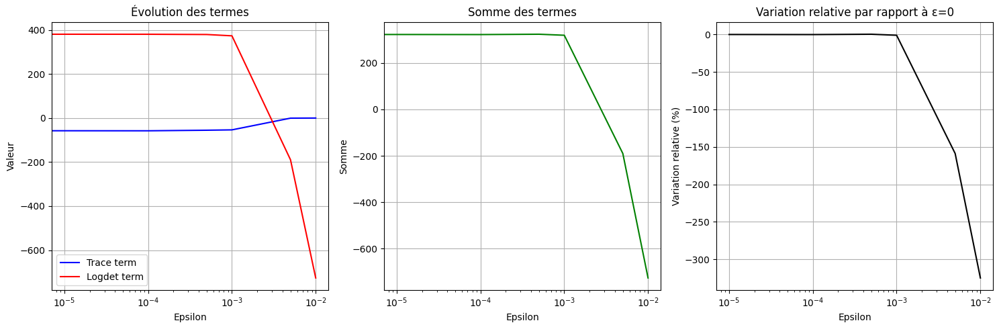

In [48]:
def analyze_terms_for_epsilons(Y, Y_lh_full, Y_rh_full, coeffs_diff_lh, coeffs_diff_rh, lh_center, rh_center, PATHS, log_sigma2=-5, log_gamma=7):
    """
    Analyse les termes pour différents epsilons avec un couple (log_sigma2, log_gamma) fixé
    """
    epsilons = [0, 1e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2]
    results = []
    
    sigma2 = np.exp(log_sigma2)
    gamma = np.exp(log_gamma)
    
    for eps in epsilons:
        print(f"\nProcessing epsilon = {eps}")
        
        # Copie et modification des coefficients avec epsilon
        coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
        coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
        
        for l in [15,20,25]:
            for m in range(2*l+1):
                coeffs_diff_lh_eps["organized_coeffs"][l][m] += np.array([eps+1j*eps, eps+1j*eps, eps+1j*eps])
                coeffs_diff_rh_eps["organized_coeffs"][l][m] += np.array([eps+1j*eps, eps+1j*eps, eps+1j*eps])
        
        # Génération des surfaces avec lmax=40
        (lh_verts, lh_faces), (rh_verts, rh_faces) = generate_and_save_surfaces(
            main_folder=PATHS['main'],
            Y_lh_full=Y_lh_full,
            Y_rh_full=Y_rh_full,
            coeffs_diff_lh=coeffs_diff_lh_eps,
            coeffs_diff_rh=coeffs_diff_rh_eps,
            lh_center=lh_center,
            rh_center=rh_center,
            lmax=40,  # augmenté à 40 comme demandé
            sigma=1e-4,
            fsaverage_path=PATHS['fsaverage'],
            merge=False 
        )
        
        # Calcul du leadfield
        meg_channel_path = os.path.join(PATHS['meg_task'], "channel_vectorview306_acc1.mat")
        L, _ = compute_leadfield(
            meg_channel_path=meg_channel_path,
            lh_vertices=lh_verts,  
            lh_faces=lh_faces,
            rh_vertices=rh_verts,  
            rh_faces=rh_faces
        )
        
        # Calcul des termes pour ce leadfield
        analyzer = StableFreeEnergy(Y, L)
        
        L_term = analyzer.L_reduced @ analyzer.L_reduced.T
        Sigma_th = sigma2 * jnp.eye(analyzer.k) + gamma * L_term
        
        sign, logdet = jnp.linalg.slogdet(Sigma_th)
        inv_Sigma = jnp.linalg.inv(Sigma_th)
        
        trace_term = -0.5 * analyzer.Nt * jnp.trace(analyzer.Sigma_Y_emp @ inv_Sigma)
        logdet_term = -0.5 * analyzer.Nt * logdet
        
        results.append({
            'epsilon': eps,
            'trace_term': float(trace_term),
            'logdet_term': float(logdet_term),
            'total': float(trace_term + logdet_term)
        })
    
    # Affichage des résultats
    import pandas as pd
    df = pd.DataFrame(results)
    print("\nRésultats pour log_sigma2 =", log_sigma2, "et log_gamma =", log_gamma)
    print(df)
    
    # Visualisation
    plt.figure(figsize=(15, 5))
    
    # Premier plot : les deux termes
    plt.subplot(131)
    plt.plot([r['epsilon'] for r in results], [r['trace_term'] for r in results], 'b-', label='Trace term')
    plt.plot([r['epsilon'] for r in results], [r['logdet_term'] for r in results], 'r-', label='Logdet term')
    plt.xscale('log')
    plt.xlabel('Epsilon')
    plt.ylabel('Valeur')
    plt.legend()
    plt.title('Évolution des termes')
    plt.grid(True)
    
    # Deuxième plot : somme
    plt.subplot(132)
    plt.plot([r['epsilon'] for r in results], [r['total'] for r in results], 'g-')
    plt.xscale('log')
    plt.xlabel('Epsilon')
    plt.ylabel('Somme')
    plt.title('Somme des termes')
    plt.grid(True)
    
    # Troisième plot : variations relatives
    base_total = results[0]['total']  # epsilon = 0
    plt.subplot(133)
    plt.plot([r['epsilon'] for r in results[1:]], 
             [(r['total'] - base_total)/abs(base_total)*100 for r in results[1:]], 'k-')
    plt.xscale('log')
    plt.xlabel('Epsilon')
    plt.ylabel('Variation relative (%)')
    plt.title('Variation relative par rapport à ε=0')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    return results

# Utilisation :
results = analyze_terms_for_epsilons(Y_processed, Y_lh_full, Y_rh_full, coeffs_diff_lh, coeffs_diff_rh, 
                                    lh_center, rh_center, PATHS, log_sigma2=-5, log_gamma=7)

In [50]:
main_folder=r"C:\Users\wbou2\Desktop\meg_to_surface_ml\data\Anatomy_data_CAM_CAN"
fsaverage_path=r"C:\Users\wbou2\Desktop\meg_to_surface_ml\data\fsaverage"

In [51]:
epsilon=1e-3

coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
for l in [5,10,20]:
    for m in range(2*l+1):
        coeffs_diff_lh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])
        coeffs_diff_rh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])

In [52]:
(lh_verts_eps, lh_faces_eps), (rh_verts_eps, rh_faces_eps) = generate_and_save_surfaces(
    main_folder=main_folder,
    Y_lh_full=Y_lh_full,
    Y_rh_full=Y_rh_full,
    coeffs_diff_lh=coeffs_diff_lh_eps,
    coeffs_diff_rh=coeffs_diff_rh_eps,
    lh_center=lh_center,
    rh_center=rh_center,
    lmax=30,
    sigma=1e-4,
    fsaverage_path=fsaverage_path,
    merge=False 
)

In [35]:
lh_faces, rh_faces, lh_verts, rh_verts=lh_faces_eps, rh_faces_eps, lh_verts_eps, rh_verts_eps

In [ ]:
left_hemi = sio.loadmat(os.path.join(subject_folder, 'left_hemi_low.mat'))['left_hemi']
right_hemi = sio.loadmat(os.path.join(subject_folder, 'right_hemi_low.mat'))['right_hemi']

lh_vertices = left_hemi['Vertices'][0,0]
lh_faces = left_hemi['Faces'][0,0]-1
rh_vertices = right_hemi['Vertices'][0,0] 
rh_faces = right_hemi['Faces'][0,0]-1


In [32]:
import pyvista as pv

# Create left and right hemisphere meshes
lh_mesh = pv.PolyData(lh_verts, convert_triangles_to_pyvista(lh_faces))
rh_mesh = pv.PolyData(rh_verts, convert_triangles_to_pyvista(rh_faces))

# Create two subplots
pl = pv.Plotter(shape=(1, 2))

# Add left hemisphere
pl.subplot(0, 0)
pl.add_mesh(lh_mesh, show_edges=True)

# Add right hemisphere 
pl.subplot(0, 1)
pl.add_mesh(rh_mesh, show_edges=True)

pl.show()

NameError: name 'convert_triangles_to_pyvista' is not defined

Calculer la leadfield matrix avec les positions 

In [ ]:
fwd, leadfield = setup_forward_model_basic(lh_verts, lh_faces, rh_verts, rh_faces, info_man)

Fitted sphere radius:         89.9 mm
Origin head coordinates:      0.8 -2.3 38.4 mm
Origin device coordinates:    0.8 -2.3 38.4 mm

Equiv. model fitting -> RV = 0.00349057 %%
mu1 = 0.944702    lambda1 = 0.137194
mu2 = 0.667435    lambda2 = 0.683781
mu3 = -0.26548    lambda3 = -0.0106058
Set up EEG sphere model with scalp radius    89.9 mm

Source space          : <SourceSpaces: [<surface (lh), n_vertices=7501, n_used=7501>, <surface (rh), n_vertices=7501, n_used=7501>] head coords, ~1.1 MiB>
MRI -> head transform : identity
Measurement data      : instance of Info
Sphere model      : origin at [0.   0.   0.04] mm
Standard field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 15002 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    1.000000 0.000000 0.000000       0.00 mm
    0.000000 1.000000 0.000000       0.00 mm
    0.000000 0.000000 1.000000       0.00 mm
    0.000000 0.000000 0.000000       

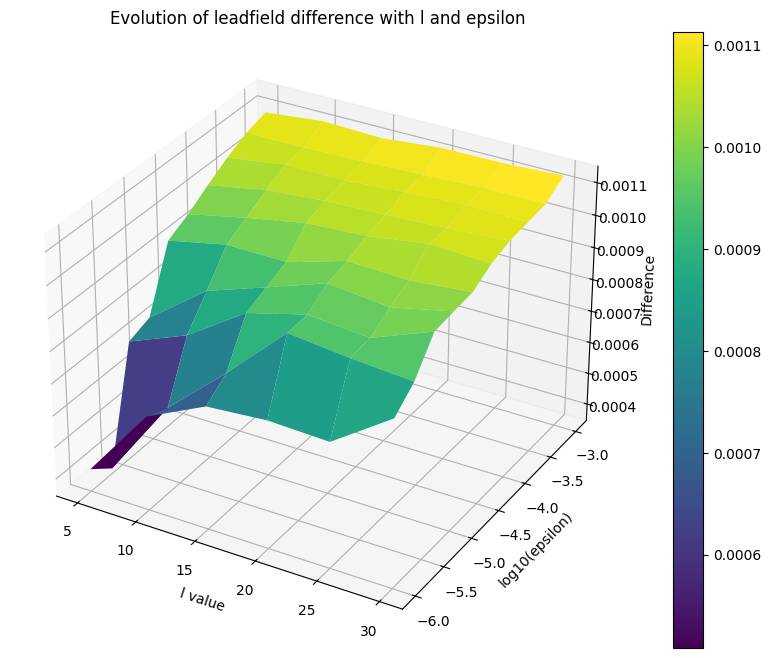

In [131]:
def leadfield_deformation(leadfield, epsilon, l_range, coeffs_diff_lh, coeffs_diff_rh, Y_lh_full, Y_rh_full, 
                         lh_center, rh_center, fsaverage_path, info_man, main_folder):
    coeffs_diff_lh_eps = copy.deepcopy(coeffs_diff_lh)
    coeffs_diff_rh_eps = copy.deepcopy(coeffs_diff_rh)
    for l in l_range:
        for m in range(2*l+1):  # Correction de la plage de m
            coeffs_diff_lh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])
            coeffs_diff_rh_eps["organized_coeffs"][l][m]+=np.array([epsilon+1j*epsilon, epsilon+1j*epsilon, epsilon+1j*epsilon])

    (lh_verts_eps, lh_faces_eps), (rh_verts_eps, rh_faces_eps) = generate_and_save_surfaces(
        main_folder=main_folder,
        Y_lh_full=Y_lh_full,
        Y_rh_full=Y_rh_full,
        coeffs_diff_lh=coeffs_diff_lh_eps,
        coeffs_diff_rh=coeffs_diff_rh_eps,
        lh_center=lh_center,
        rh_center=rh_center,
        lmax=40,
        sigma=1e-4,
        fsaverage_path=fsaverage_path,
        merge=False 
    )
    
    fwd_eps, leadfield_eps = setup_forward_model_basic(lh_verts_eps, lh_faces_eps, rh_verts_eps, rh_faces_eps, info_man)

    return compare_matrices(leadfield, leadfield_eps)

# Code pour le plot 3D
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Définition des paramètres
l_values = [5, 10, 15, 20, 25, 30]
epsilon_values = np.logspace(-6, -3, 10)  # 10 valeurs entre 1e-6 et 1e-3
results = np.zeros((len(l_values), len(epsilon_values)))

# Calcul des différences pour chaque combinaison
for i, l in enumerate(l_values):
    for j, eps in enumerate(epsilon_values):
        results[i,j] = leadfield_deformation(leadfield, eps, [l], coeffs_diff_lh, coeffs_diff_rh, 
                                           Y_lh_full, Y_rh_full, lh_center, rh_center, 
                                           fsaverage_path, info_man, main_folder)

# Création du plot 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Création de la grille pour le plot
L, E = np.meshgrid(l_values, epsilon_values)

# Plot de la surface
surf = ax.plot_surface(L, np.log10(E), results.T, cmap='viridis')

# Paramètres du plot
ax.set_xlabel('l value')
ax.set_ylabel('log10(epsilon)')
ax.set_zlabel('Difference')
plt.colorbar(surf)
plt.title('Evolution of leadfield difference with l and epsilon')
plt.show()

In [8]:
meg_data=sio.loadmat(r"C:\Users\wbou2\Desktop\sub-CC710548\meg_task\data_block001")
data_cov=sio.loadmat(r"C:\Users\wbou2\Desktop\sub-CC710548\meg_task\ndatacov_full.mat")
noise_cov=sio.loadmat(r"C:\Users\wbou2\Desktop\sub-CC710548\meg_task\noisecov_full.mat")

Free energy implementation 

In [43]:
import jax
import jax.numpy as jnp
from jax import grad, jit
from scipy.optimize import minimize

class FastMEGOptimizer:
    def __init__(self, Y, L, n_components=15):
        self.Nc, self.Nt = Y.shape
        self.Ns = L.shape[1]
        
        # Convert to JAX arrays
        self.Y = jnp.array(Y)
        self.L = jnp.array(L)

        U, s, Vh = jnp.linalg.svd(self.L, full_matrices=False)
        self.k = min(n_components, len(s))
        self.U_k = U[:, :self.k]
        
        self.Y_mean = jnp.mean(self.Y, axis=1, keepdims=True)
        Y_centered = self.Y - self.Y_mean
        self.Y_reduced = self.U_k.T @ Y_centered
        self.L_reduced = self.U_k.T @ self.L

        self.Sigma_Y = (self.Y_reduced @ self.Y_reduced.T) / (self.Nt - 1)
        lambda_reg = 1e-20 * jnp.trace(self.Sigma_Y) / self.k
        self.Sigma_Y += lambda_reg * jnp.eye(self.k)
        self.inv_Y = jnp.linalg.inv(self.Sigma_Y)

        M = self.L_reduced.T @ self.inv_Y @ self.L_reduced
        lambda_reg_M = 1e-30 * jnp.trace(M) / M.shape[0]
        M_reg = M + lambda_reg_M * jnp.eye(M.shape[0])
        self.Qa = jnp.linalg.inv(M_reg)

        self.lambda_init = jnp.array([1e-4, 1e-4])
        self.nu = jnp.array([1e-4, 1e-4])
        self.Pi = 1e-13* jnp.eye(2)

        # JIT compile key functions
        self.build_sigma_a = jit(self.build_sigma_a)
        self.compute_free_energy = jit(self.compute_free_energy)
        self._compute_gradient = jit(grad(self.compute_free_energy))

    def build_sigma_a(self, lambda_params):
        lambda0, lambda1 = lambda_params
        return lambda0 * jnp.eye(self.k) + lambda1 * (self.L_reduced @ self.Qa @ self.L_reduced.T)

    def compute_free_energy(self, lambda_params):
        Sa = self.build_sigma_a(lambda_params)
        invSa = jnp.linalg.inv(Sa)
        
        sign, logdet = jnp.linalg.slogdet(Sa)
        
        tr_term = -(self.Nt / 2.0) * jnp.trace(self.Sigma_Y @ invSa)
        log_det_term = -(self.Nt / 2.0) * logdet
        
        diff = lambda_params - self.nu
        prior_term = -0.5 * diff.T @ self.Pi @ diff
        const_term = -(self.Nt * self.Nc / 2.0) * jnp.log(2.0 * jnp.pi)
        
        return tr_term + log_det_term + prior_term + const_term

    def compute_gradient(self, lambda_params):
        if jnp.any(lambda_params < 0):
            return jnp.zeros_like(lambda_params)
        return self._compute_gradient(lambda_params)

    def optimize(self):
        starts = [
            self.lambda_init,
            jnp.array([1e-10, 1e-22]),
            jnp.array([1e-10, 1e-22]),
            jnp.array([1e-10, 1e-18])
        ]

        best_result = None
        best_fe = -jnp.inf

        for start_point in starts:
            result = minimize(
                fun=lambda x: -self.compute_free_energy(x),
                x0=start_point,
                jac=lambda x: -self.compute_gradient(x),
                method='L-BFGS-B',
                options={'maxiter': 250}
            )

            if result.success:
                fe = self.compute_free_energy(result.x)
                if fe > best_fe:
                    best_fe = fe
                    best_result = result

        if best_result is None:
            raise RuntimeError("Optimization failed for all starting points")

        self.lambda_opt = best_result.x
        return {
            'lambda_opt': self.lambda_opt,
            'free_energy': best_fe,
            'success': best_result.success
        }

    def solve(self, lambda_params):
        Sigma_a = self.build_sigma_a(lambda_params)
        solution = self.Qa @ self.L_reduced.T @ jnp.linalg.solve(Sigma_a, self.Y_reduced)
        return solution

In [197]:
import jax
import jax.numpy as jnp
from jax import grad, jit
from scipy.optimize import minimize

class FastMEGOptimizer:
    def __init__(self, Y, L, n_components=15):
        self.Nc, self.Nt = Y.shape
        self.Ns = L.shape[1]
        
        # Convert to JAX arrays
        self.Y = jnp.array(Y)
        self.L = jnp.array(L)

        U, s, Vh = jnp.linalg.svd(self.L, full_matrices=False)
        self.k = min(n_components, len(s))
        self.U_k = U[:, :self.k]
        
        Y_centered = self.Y 
        self.Y_reduced = self.U_k.T @ Y_centered
        self.L_reduced = self.U_k.T @ self.L

        self.Sigma_Y = (self.Y_reduced @ self.Y_reduced.T) / (self.Nt - 1)
        self.inv_Y = jnp.linalg.inv(self.Sigma_Y)

        self.lambda_init = jnp.array([1e-4, 1e-4])
        self.nu = jnp.array([1e-4, 1e-4])
        self.Pi = 1* jnp.eye(2)

        # JIT compile key functions
        self.build_sigma_a = jit(self.build_sigma_a)
        self.compute_free_energy = jit(self.compute_free_energy)
        self._compute_gradient = jit(grad(self.compute_free_energy))

    def build_sigma_a(self, lambda_params):
        lambda0, lambda1 = lambda_params
        return lambda0 * jnp.eye(self.k) + lambda1 * (self.L_reduced @ self.L_reduced.T)

    def compute_free_energy(self, lambda_params):
        Sa = self.build_sigma_a(lambda_params)
        invSa = jnp.linalg.inv(Sa)
        
        sign, logdet = jnp.linalg.slogdet(Sa)
        
        tr_term = -(self.Nt / 2.0) * jnp.trace(self.Sigma_Y @ invSa)
        log_det_term = -(self.Nt / 2.0) * logdet
        
        diff = lambda_params - self.nu
        prior_term = -0.5 * diff.T @ self.Pi @ diff
        const_term = -(self.Nt * self.Nc / 2.0) * jnp.log(2.0 * jnp.pi)
        
        return tr_term + log_det_term + prior_term + const_term

    def compute_gradient(self, lambda_params):
        if jnp.any(lambda_params < 0):
            return jnp.zeros_like(lambda_params)
        return self._compute_gradient(lambda_params)

    def optimize(self):
        starts = [
            self.lambda_init,
            jnp.array([1e-10, 1e-22]),
            jnp.array([1e-10, 1e-22]),
            jnp.array([1e-10, 1e-18])
        ]

        best_result = None
        best_fe = -jnp.inf

        for start_point in starts:
            result = minimize(
                fun=lambda x: -self.compute_free_energy(x),
                x0=start_point,
                jac=lambda x: -self.compute_gradient(x),
                method='L-BFGS-B',
                options={'maxiter': 250}
            )

            if result.success:
                fe = self.compute_free_energy(result.x)
                if fe > best_fe:
                    best_fe = fe
                    best_result = result

        if best_result is None:
            raise RuntimeError("Optimization failed for all starting points")

        self.lambda_opt = best_result.x
        return {
            'lambda_opt': self.lambda_opt,
            'free_energy': best_fe,
            'success': best_result.success
        }

    def solve(self, lambda_params):
        Sigma_a = self.build_sigma_a(lambda_params)
        solution = self.L_reduced.T @ jnp.linalg.solve(Sigma_a, self.Y_reduced)
        return solution

In [198]:
# Chargement des données
import numpy as np
#
#  Préparation des données
L = leadfield  # Leadfield matrix

# Création de l'optimiseur
optimizer = FastMEGOptimizer(Y_processed, L)

# Optimisation des hyperparamètres
results = optimizer.optimize()
lambda_param=results["lambda_opt"]
# Si besoin de J
J = optimizer.solve(lambda_param)

In [23]:
results

{'theta_opt': Array([-42.504295, -29.946476], dtype=float32),
 'free_energy': 16856.609375,
 'success': True,
 'gradient_norm': Array(196.87909, dtype=float32)}

In [72]:
import jax
import jax.numpy as jnp
from jax import grad, jit
from scipy.optimize import minimize

class FastMEGOptimizer:
    def __init__(self, Y, L, n_components=15):
        self.Nc, self.Nt = Y.shape
        self.Ns = L.shape[1]
        
        self.Y = jnp.array(Y)
        self.L = jnp.array(L)

        U, s, Vh = jnp.linalg.svd(self.L, full_matrices=False)
        self.k = min(n_components, len(s))
        self.U_k = U[:, :self.k]

        self.Y_mean = jnp.mean(self.Y, axis=1, keepdims=True)
        Y_centered = self.Y - self.Y_mean
        self.Y_reduced = self.U_k.T @ Y_centered
        self.L_reduced = self.U_k.T @ self.L

        self.Sigma_Y_emp = (self.Y_reduced @ self.Y_reduced.T) / (self.Nt - 1)

        self.nu = jnp.array([-9.0, -9.0])
        self.Pi = 1/256 * jnp.eye(2)

        self.starts = [
            jnp.array([-10.0, -10.0]),
            jnp.array([-6.0, -6.0]),
            jnp.array([-4.0, -4.0]),
            jnp.array([-2.0, -8.0]),
        ]

        self.build_sigma_theo = jit(self.build_sigma_theo)
        self.compute_free_energy = jit(self.compute_free_energy)
        self._compute_gradient = jit(grad(self.compute_free_energy))

    def build_sigma_theo(self, theta):
        log_sigma2, log_gamma = theta
        sigma2 = jnp.exp(log_sigma2)
        gamma  = jnp.exp(log_gamma)

        return sigma2 * jnp.eye(self.k) + gamma * (self.L_reduced @ self.L_reduced.T)

    def compute_free_energy(self, theta):
        Sigma_th = self.build_sigma_theo(theta)
        inv_Sigma_th = jnp.linalg.inv(Sigma_th)

        sign, logdet = jnp.linalg.slogdet(Sigma_th)

        trace_term = -(self.Nt / 2.0) * jnp.trace(self.Sigma_Y_emp @ inv_Sigma_th)
        log_det_term = -(self.Nt / 2.0) * logdet

        diff = theta - self.nu
        prior_term = -0.5 * diff.T @ (self.Pi @ diff)

        const_term = -(self.Nt * self.k / 2.0) * jnp.log(2.0 * jnp.pi)

        return trace_term + log_det_term + prior_term + const_term

    def compute_gradient(self, theta):
        return self._compute_gradient(theta)

    def optimize(self, maxiter=500):
        best_result = None
        best_fe = -jnp.inf

        for i, start_point in enumerate(self.starts):
            fe_init = self.compute_free_energy(start_point)
            grad_init = self.compute_gradient(start_point)
            print(f"\n[DEBUG] Start {i}, init={start_point}, FE={fe_init}, grad={grad_init}")

            result = minimize(
                fun=lambda x: -self.compute_free_energy(x),
                x0=start_point,
                jac=lambda x: -self.compute_gradient(x),
                method='L-BFGS-B',
                options={'maxiter': maxiter, 'disp': False}
            )

            print(f"[DEBUG] Start {i} => success={result.success}, message={result.message}, x={result.x}")

            if result.success:
                fe_val = self.compute_free_energy(result.x)
                if fe_val > best_fe:
                    best_fe = fe_val
                    best_result = result

        if best_result is None:
            raise RuntimeError("Aucune optimisation n'a abouti à un succès.")

        self.theta_opt = best_result.x
        return {
            'theta_opt': self.theta_opt,
            'free_energy': best_fe,
            'success': best_result.success
        }

    def solve(self, theta=None):
        if theta is None:
            if not hasattr(self, 'theta_opt'):
                raise ValueError("Il faut d'abord appeler optimizer.optimize() ou fournir theta.")
            theta = self.theta_opt

        Sigma_th = self.build_sigma_theo(theta)
        inv_Sigma_th = jnp.linalg.inv(Sigma_th)

        log_sigma2, log_gamma = theta
        gamma  = jnp.exp(log_gamma)

        a_post_reduced = gamma * (self.L_reduced.T @ (inv_Sigma_th @ self.Y_reduced))

        return a_post_reduced


In [38]:
import jax
import jax.numpy as jnp
from jax import grad, jit
from functools import partial

class FastMEGOptimizer:
    def __init__(self, Y, L, n_components=23):
        self.Nc, self.Nt = Y.shape
        self.Ns = L.shape[1]
        
        self.Y = jnp.array(Y)
        self.L = jnp.array(L)

        U, s, Vh = jnp.linalg.svd(self.L, full_matrices=False)
        self.k = min(n_components, len(s))
        self.U_k = U[:, :self.k]

        Y_centered = self.Y 
        self.Y_reduced = self.U_k.T @ Y_centered
        self.L_reduced = self.U_k.T @ self.L

        self.Sigma_Y_emp = (self.Y_reduced @ self.Y_reduced.T) / (self.Nt)
        self.inv_Y=jnp.linalg.inv(self.Sigma_Y_emp)
        M=self.L_reduced.T@self.inv_Y@self.L_reduced
        lambda_reg_M = 1e-19 * np.trace(M) / M.shape[0] 
        M_reg = M + lambda_reg_M * np.eye(M.shape[0], dtype=np.float64)
    
        self.Qa=jnp.linalg.inv(M_reg)

        self.nu = jnp.array([-40.0, -40.0])
        self.Pi = 1e-3 * jnp.eye(2)

        # Grid search initialization
        def create_grid_points():
            # Définir les plages pour log_sigma2 et log_gamma
            log_sigma2_range = jnp.array([-10.0])
            log_gamma_range = jnp.array([-20.0])
            
            grid_points = []
            for log_s2 in log_sigma2_range:
                for log_g in log_gamma_range:
                    grid_points.append(jnp.array([float(log_s2), float(log_g)]))
            
            return grid_points
        
        self.starts = create_grid_points()

        self.build_sigma_theo = jit(self.build_sigma_theo)
        self.compute_free_energy = jit(self.compute_free_energy)
        self._compute_gradient = jit(grad(self.compute_free_energy))

    def build_sigma_theo(self, theta):
        log_sigma2, log_gamma = theta
        sigma2 = jnp.exp(log_sigma2)
        gamma  = jnp.exp(log_gamma)
        return sigma2 * jnp.eye(self.k) + gamma * (self.L_reduced @self.Qa@ self.L_reduced.T)

    def compute_free_energy(self, theta):
        Sigma_th = self.build_sigma_theo(theta)
        inv_Sigma_th = jnp.linalg.inv(Sigma_th)

        sign, logdet = jnp.linalg.slogdet(Sigma_th)

        trace_term = -(self.Nt / 2.0) * jnp.trace(self.Sigma_Y_emp @ inv_Sigma_th)
        log_det_term = -(self.Nt / 2.0) * logdet

        diff = theta - self.nu
        prior_term = -0.5 * diff.T @ (self.Pi @ diff)

        const_term = -(self.Nt * self.k / 2.0) * jnp.log(2.0 * jnp.pi)

        return trace_term + log_det_term + prior_term + const_term

    def compute_gradient(self, theta):
        return self._compute_gradient(theta)

    @partial(jit, static_argnums=(0,))
    def _adam_step(self, theta, m, v, t,beta1=0.9, beta2=0.999, epsilon=1e-8):
        g = self.compute_gradient(theta)
        grad_norm = jnp.linalg.norm(g)
        
        # Learning rates différents pour chaque paramètre
        alphas = jnp.array([5e-3, 1e-3])  # Plus grand pour sigma, plus petit pour gamma
        
        # Clipping du gradient si nécessaire
        g = jnp.where(grad_norm > 10000.0, g / (grad_norm/1000.00), g)
        
        m = beta1 * m + (1 - beta1) * g
        v = beta2 * v + (1 - beta2) * (g * g)
        
        m_hat = m / (1 - beta1 ** t)
        v_hat = v / (1 - beta2 ** t)
        
        update = alphas * m_hat / (jnp.sqrt(v_hat) + epsilon)
        return theta + update, m, v, g, grad_norm
    
    def optimize(self, maxiter=1000, beta1=0.75, beta2=0.8, epsilon=1e-14, tol=1e-11, log_every=1, coarse_search=True):
        """
        Optimize with optional coarse grid search before fine optimization.
        
        Parameters:
        -----------
        coarse_search : bool
            If True, do a quick evaluation of all starting points before full optimization
        """
        best_result = None
        best_fe = -float('inf')  # Using Python float instead of JAX array

        # Évaluation rapide initiale de tous les points si demandé
        if coarse_search:
            print("\n=== Coarse Grid Search ===")
            initial_energies = []
            for i, point in enumerate(self.starts):
                fe = float(self.compute_free_energy(point))  # Convert to Python float
                initial_energies.append((fe, i, point))
            
            # Trier par énergie libre décroissante
            initial_energies.sort(reverse=True)
            
            # Garder les 5 meilleurs points
            n_best = min(10, len(self.starts))
            best_starts = [self.starts[idx] for _, idx, _ in initial_energies[:n_best]]
            
            print(f"\nTop {n_best} starting points from grid search:")
            for i, (fe, _, point) in enumerate(initial_energies[:n_best]):
                print(f"{i+1}. θ = [{point[0]:.4f}, {point[1]:.4f}], FE = {fe:.4f}")
            
            start_points = best_starts
        else:
            start_points = self.starts
        
        print(f"\n=== Starting Fine Optimization ===")
        for i, start_point in enumerate(start_points):
            print(f"\n{'='*50}")
            print(f"Starting optimization from point {i+1}/{len(start_points)}")
            print(f"Initial θ = [{start_point[0]:.4f}, {start_point[1]:.4f}]")
            
            theta = start_point
            m = jnp.zeros_like(theta)
            v = jnp.zeros_like(theta)
            
            fe_init = self.compute_free_energy(theta)
            grad_init = self.compute_gradient(theta)
            print(f"Initial Free Energy: {fe_init:.4f}")
            print(f"Initial Gradient: [{grad_init[0]:.4f}, {grad_init[1]:.4f}]")
            print(f"{'='*50}\n")
            
            prev_fe = -float('inf')
            n_similar = 0  # Counter for consecutive similar values
            
            for t in range(1, maxiter + 1):
                theta, m, v, gradient, grad_norm = self._adam_step(theta, m, v, t, beta1, beta2, epsilon)
                curr_fe = float(self.compute_free_energy(theta))  # Convert to Python float
                
                # Log progress every log_every iterations
                if t % log_every == 0 or t == 1:
                    sigma2, gamma = jnp.exp(theta[0]), jnp.exp(theta[1])
                    print(f"Iteration {t}:")
                    print(f"  θ = [{theta[0]:.6f}, {theta[1]:.6f}]")
                    print(f"  σ² = {sigma2:.6e}, γ = {gamma:.6e}")
                    print(f"  Free Energy = {curr_fe:.6f}")
                    print(f"  Gradient = [{gradient[0]:.6f}, {gradient[1]:.6f}] (norm: {grad_norm:.6f})\n")
                
                # Check convergence criteria
                if t > 1:
                    rel_change = abs(curr_fe - prev_fe) / (abs(prev_fe) + 1e-8)
                    
                    # Count number of iterations with very small changes
                    if rel_change < tol/10:
                        n_similar += 1
                    else:
                        n_similar = 0
                    
                    # Convergence criteria:
                    # 1. Relative change in free energy is small
                    # 2. Gradient norm is reasonably small
                    # 3. We've had several iterations with very small changes
                    if rel_change < tol and grad_norm < 1.0 and n_similar >= 5:
                        print(f"\nConverged after {t} iterations!")
                        print(f"Final relative change: {rel_change:.2e}")
                        print(f"Final gradient norm: {grad_norm:.2e}")
                        break
                    elif t >= maxiter:
                        print("\nReached maximum iterations without convergence!")
                        print(f"Final relative change: {rel_change:.2e}")
                        print(f"Final gradient norm: {grad_norm:.2e}")
                        
                prev_fe = curr_fe
            
            success = True
            result = {
                'x': theta,
                'success': success,
                'nit': t,
                'free_energy': curr_fe,
                'final_gradient_norm': grad_norm
            }
            
            print(f"\nOptimization from start point {i+1} completed:")
            print(f"Final θ = [{theta[0]:.6f}, {theta[1]:.6f}]")
            print(f"Final Free Energy = {curr_fe:.6f}")
            print(f"Final gradient norm = {grad_norm:.6f}")
            
            if curr_fe > best_fe:
                best_fe = curr_fe
                best_result = result
                print("→ New best result found!")

        print("\n=== Optimization Complete ===")
        print(f"Best result found:")
        print(f"θ = [{best_result['x'][0]:.6f}, {best_result['x'][1]:.6f}]")
        print(f"Free Energy = {best_fe:.6f}")
        print(f"Final gradient norm = {best_result['final_gradient_norm']:.6f}")
        
        self.theta_opt = best_result['x']
        return {
            'theta_opt': self.theta_opt,
            'free_energy': best_fe,
            'success': best_result['success'],
            'gradient_norm': best_result['final_gradient_norm']
        }

    def solve(self, theta=None):
        if theta is None:
            if not hasattr(self, 'theta_opt'):
                raise ValueError("Il faut d'abord appeler optimizer.optimize() ou fournir theta.")
            theta = self.theta_opt

        Sigma_th = self.build_sigma_theo(theta)
        inv_Sigma_th = jnp.linalg.inv(Sigma_th)

        log_sigma2, log_gamma = theta
        gamma = jnp.exp(log_gamma)

        a_post_reduced = gamma * (self.L_reduced.T @ (inv_Sigma_th @ self.Y_reduced))

        return a_post_reduced

In [39]:
#  Préparation des données
L = leadfield  # Leadfield matrix

# Création de l'optimiseur
optimizer = FastMEGOptimizer(Y_processed, L)

# Optimisation des hyperparamètres
results = optimizer.optimize(coarse_search=True)
lambda_param=results['theta_opt']
# Si besoin de J
J = optimizer.solve(lambda_param)


=== Coarse Grid Search ===

Top 1 starting points from grid search:
1. θ = [-10.0000, -20.0000], FE = 2627.5537

=== Starting Fine Optimization ===

Starting optimization from point 1/1
Initial θ = [-10.0000, -20.0000]


MemoryError: bad allocation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg
import seaborn as sns

# Fonction pour calculer la free energy (negative)
def compute_free_energy(Y, L, log_sigma2, log_gamma, n_components=23):
    """
    Calcule la negative free energy pour des valeurs données de log_sigma2 et log_gamma
    """
    # Paramètres
    Nc, Nt = Y.shape
    Ns = L.shape[1]
    
    # SVD du lead-field
    U, s, Vh = np.linalg.svd(L, full_matrices=False)
    k = min(n_components, len(s))
    U_k = U[:, :k]
    
    # Réduction dimensionnelle
    Y_mean = np.mean(Y, axis=1, keepdims=True)
    Y_reduced = U_k.T @ Y
    Y_reduced_T = Y_reduced.T
    L_reduced = U_k.T @ L
    
    # Pré-calculs
    YYT = Y_reduced_T.T @ Y_reduced_T / Nt
    YYT_inv = np.linalg.inv(YYT)
    Qa = np.linalg.inv(L_reduced.T @ YYT_inv @ L_reduced)
    
    # Paramètres du modèle
    sigma2 = np.exp(log_sigma2)  # λ1
    gamma = np.exp(log_gamma)    # λ2
    
    # Calcul de Σ = Qe + LaQaLa^T
    Sigma = sigma2 * np.eye(k) + gamma * (L_reduced @ Qa @ L_reduced.T)
    
    # Calcul de la log-vraisemblance
    sign, logdet = np.linalg.slogdet(Sigma)
    log_likelihood = -0.5 * (
        Nt * (k * np.log(2 * np.pi) + logdet) +
        np.trace(np.linalg.solve(Sigma, Y_reduced_T.T @ Y_reduced_T))
    )
    
    # Prior sur les hyperparamètres (si nécessaire)
    nu = np.array([-14.0, -14.0])
    scale = np.sqrt(1e10)
    log_prior = -0.5 * (((log_sigma2 - nu[0])/scale)**2 + ((log_gamma - nu[1])/scale)**2)
    
    # Free energy totale
    free_energy = log_likelihood + log_prior
    
    return free_energy

# Création d'une grille de valeurs pour log_sigma2 et log_gamma
log_sigma2_range = np.linspace(-20, 0, 50)
log_gamma_range = np.linspace(-20, 0, 50)
X, Y = np.meshgrid(log_sigma2_range, log_gamma_range)

# Calcul de la free energy pour chaque point de la grille
Z = np.zeros_like(X)
for i in range(len(log_sigma2_range)):
    for j in range(len(log_gamma_range)):
        Z[j, i] = compute_free_energy(Y_processed, leadfield, 
                                    X[j, i], Y[j, i])

# Visualisation
plt.figure(figsize=(12, 8))
contour = plt.contourf(X, Y, Z, levels=50, cmap='viridis')
plt.colorbar(contour, label='Negative Free Energy')
plt.xlabel('log(λ1) = log(σ²)')
plt.ylabel('log(λ2) = log(γ)')
plt.title('Negative Free Energy Landscape')

# Ajout des points de maximum
max_idx = np.unravel_index(np.argmax(Z), Z.shape)
plt.plot(X[max_idx], Y[max_idx], 'r*', markersize=15, label='Maximum')
plt.legend()

# Affichage des valeurs optimales
print(f"Valeurs optimales trouvées:")
print(f"log(λ1) = {X[max_idx]:.3f}")
print(f"log(λ2) = {Y[max_idx]:.3f}")
print(f"λ1 = {np.exp(X[max_idx]):.3e}")
print(f"λ2 = {np.exp(Y[max_idx]):.3e}")

plt.show()

# Visualisation des coupes 1D
plt.figure(figsize=(15, 5))

# Coupe selon log(λ1)
plt.subplot(121)
plt.plot(X[0, :], Z[max_idx[0], :])
plt.axvline(X[max_idx], color='r', linestyle='--')
plt.xlabel('log(λ1)')
plt.ylabel('Negative Free Energy')
plt.title('Coupe à log(λ2) optimal')

# Coupe selon log(λ2)
plt.subplot(122)
plt.plot(Y[:, 0], Z[:, max_idx[1]])
plt.axvline(Y[max_idx], color='r', linestyle='--')
plt.xlabel('log(λ2)')
plt.ylabel('Negative Free Energy')
plt.title('Coupe à log(λ1) optimal')

plt.tight_layout()
plt.show()

Brouillon visualisation


In [ ]:
import pyvista as pv
import numpy as np

# Points des capteurs
grad_pos = np.array([loc[:3] for loc, type in zip(ch_locs, ch_types) if type == 'grad'])
mag_pos = np.array([loc[:3] for loc, type in zip(ch_locs, ch_types) if type == 'mag'])

# Création des point clouds
grad_cloud = pv.PolyData(grad_pos)
mag_cloud = pv.PolyData(mag_pos)
fiducials_cloud = pv.PolyData(fiducials_pos)

# Création du plot
p = pv.Plotter()

# Ajout des différents points avec des couleurs distinctes
p.add_mesh(grad_cloud, color='blue', point_size=10, render_points_as_spheres=True, label='Gradiometers')
p.add_mesh(mag_cloud, color='red', point_size=10, render_points_as_spheres=True, label='Magnetometers')
p.add_mesh(fiducials_cloud, color='green', point_size=15, render_points_as_spheres=True, label='Fiducials')

# Configuration de la vue
p.camera_position = 'xy'
p.add_legend()  # Ajoute une légende pour identifier les différents points

p.show()

In [ ]:
import pyvista as pv
import numpy as np

# Extract positions for gradiometers and magnetometers
grad_pos = np.array([loc[:3] for loc, type in zip(ch_locs, ch_types) if type == 'grad'])
mag_pos = np.array([loc[:3] for loc, type in zip(ch_locs, ch_types) if type == 'mag'])

# Create mesh
mesh = pv.PolyData(lh_verts_eps, convert_triangles_to_pyvista(lh_faces_eps))

# Create plotter
pl = pv.Plotter()
pl.add_mesh(mesh, color='gray', opacity=0.3)
pl.add_points(grad_pos, color='blue', point_size=10, label='Gradiometers')
pl.add_points(mag_pos, color='red', point_size=10, label='Magnetometers')
pl.add_title('MEG Sensors and Brain Surface')
pl.add_legend()

pl.show(window_size=[800, 600])

In [ ]:
import pyvista as pv
import numpy as np

# Points des capteurs
grad_pos = np.array([loc[:3] for loc, type in zip(ch_locs, ch_types) if type == 'grad'])
mag_pos = np.array([loc[:3] for loc, type in zip(ch_locs, ch_types) if type == 'mag'])

# Points des head points (valeurs exactes)
fiducials_head = np.array([
    [0.00338701, 0.07067233, 0.00113151],   # NAS - valeurs exactes
    [0.09426336, 0.00128617, 0.03036019],   # LPA - valeurs exactes
    [0.00396028, -0.06852989, -0.00344175]  # RPA - valeurs exactes
])

# Création des point clouds
grad_cloud = pv.PolyData(grad_pos)
mag_cloud = pv.PolyData(mag_pos)
fiducials_head_cloud = pv.PolyData(fiducials_head)

# Création du plot
p = pv.Plotter()
p.add_mesh(grad_cloud, color='blue', point_size=10, render_points_as_spheres=True)
p.add_mesh(mag_cloud, color='red', point_size=10, render_points_as_spheres=True)
p.add_mesh(fiducials_head_cloud, color='yellow', point_size=15, render_points_as_spheres=True)
p.camera_position = 'xy'
p.show()

In [ ]:
import numpy as np

def frequency_domain_transform_windowed(Y, sfreq, freq_range=(5, 40), window_size=600, overlap=0.5):
    """
    Transforme les données temporelles en domaine fréquentiel sur des fenêtres 
    de taille 'window_size' avec recouvrement, en ne retenant que la bande d'intérêt.
    
    Paramètres
    ----------
    Y : ndarray, shape (n_channels, n_times)
        Données MEG/EEG temporelles.
    sfreq : float
        Fréquence d'échantillonnage en Hz.
    freq_range : tuple, optional
        Bande de fréquences d'intérêt (Hz), par défaut (5, 40).
    window_size : int, optional
        Taille de la fenêtre temporelle pour la FFT (nombre de points).
    overlap : float, optional
        Fraction de recouvrement entre fenêtres (ex: 0.5 pour 50% de recouvrement).
        
    Retourne
    --------
    spec_array : ndarray, shape (n_segments, n_channels, n_freqs)
        Ensemble des spectres (complexes) pour chaque segment et chaque canal
        dans la bande d'intérêt.
    freqs_band : ndarray
        Vecteur des fréquences correspondant aux coefficients conservés.
    """
    n_channels, n_times = Y.shape
    step = int(window_size * (1 - overlap))
    segments = []
    for start in range(0, n_times - window_size + 1, step):
        segment = Y[:, start:start+window_size]
        # Appliquer la fenêtre de Hann
        window = np.hanning(window_size)
        segment = segment * window[None, :]
        segments.append(segment)
    segments = np.array(segments)  # shape: (n_segments, n_channels, window_size)
    
    spec_list = []
    for seg in segments:
        seg_fft = np.fft.fft(seg, axis=1)
        freqs = np.fft.fftfreq(window_size, d=1/sfreq)
        pos_mask = freqs >= 0
        seg_fft = seg_fft[:, pos_mask]
        freqs = freqs[pos_mask]
        # Sélection de la bande d'intérêt
        band_mask = (freqs >= freq_range[0]) & (freqs <= freq_range[1])
        spec_list.append(seg_fft[:, band_mask])
    
    spec_array = np.array(spec_list)  # shape: (n_segments, n_channels, n_freqs)
    freqs_band = freqs[band_mask]
    
    return spec_array, freqs_band

def estimate_R_data(spec_array):
    """
    Estime la matrice de cross-spectral density (CSD) R_data à partir des segments
    en domaine fréquentiel.
    
    Paramètres
    ----------
    spec_array : ndarray, shape (n_segments, n_channels, n_freqs)
        Ensemble des spectres complexes pour chaque segment.
        
    Retourne
    --------
    R_data : ndarray, shape (n_channels, n_channels)
        Estimation moyenne de la CSD sur l'ensemble des segments et des fréquences.
    R_freqs : ndarray, shape (n_channels, n_channels, n_freqs)
        CSD estimée pour chaque fréquence (optionnel, pour une analyse fréquentielle détaillée).
    """
    n_segments, n_channels, n_freqs = spec_array.shape
    # Calculer la CSD pour chaque fréquence en moyennant sur les segments
    R_freqs = np.zeros((n_channels, n_channels, n_freqs), dtype=complex)
    for j in range(n_freqs):
        for s in range(n_segments):
            y = spec_array[s, :, j]  # Vecteur (n_channels,)
            R_freqs[:, :, j] += np.outer(y, np.conjugate(y))
        R_freqs[:, :, j] /= n_segments
        
    # Optionnel : moyenne sur les fréquences de la bande d'intérêt
    R_data = np.mean(R_freqs, axis=2)
    
    return R_data, R_freqs

# Exemple d'utilisation :
# Supposons que Y soit vos données temporelles de forme (n_channels, n_times),
# et que sfreq = 600 Hz.
sfreq = 600.0
freq_range = (5, 40)
spec_array, freqs_band = frequency_domain_transform_windowed(Y, sfreq, freq_range,
                                                               window_size=600, overlap=0.5)
print("Spec_array shape (n_segments, n_channels, n_freqs):", spec_array.shape)
print("Fréquences sélectionnées :", freqs_band)

# Estimation de la CSD sur la bande d'intérêt
R_data, R_freqs = estimate_R_data(spec_array)
print("R_data shape (n_channels, n_channels):", R_data.shape)


In [ ]:
import numpy as np
from scipy.signal import welch

def compute_psd_welch(Y, sfreq, fmin=1, fmax=100):
    """
    Calcule la PSD moyenne (sur les canaux) via la méthode de Welch.
    """
    n_channels, n_times = Y.shape
    
    # Paramètres Welch
    nperseg = int(4 * sfreq)   # taille de segment, ex: 4s
    noverlap = nperseg // 2    # recouvrement
    
    # Welch sur chaque canal (axis=1 => temps en 1er)
    freqs, psd = welch(Y, fs=sfreq, window='hann', 
                       nperseg=nperseg, noverlap=noverlap, 
                       axis=1)
    
    # Moyenne sur les canaux
    psd_mean = psd.mean(axis=0)
    
    # Sélection de la bande d'intérêt
    mask = (freqs >= fmin) & (freqs <= fmax)
    return freqs[mask], psd_mean[mask]

def compute_psd_fft_full(Y, sfreq, fmin=1, fmax=100, window='hann'):
    """
    Calcule la PSD par FFT sur l'intégralité du signal, 
    en moyennant ensuite sur les canaux.
    """
    n_channels, n_times = Y.shape
    
    # 1) Soustraction de la moyenne (par canal)
    Y_demean = Y - Y.mean(axis=1, keepdims=True)
    
    # 2) Fenêtre (Hann, si souhaité)
    if window == 'hann':
        win = np.hanning(n_times)
    elif window is None:
        win = np.ones(n_times)
    else:
        raise ValueError("Seules les fenêtres 'hann' ou None sont gérées ici.")
    
    Y_win = Y_demean * win[np.newaxis, :]
    
    # 3) FFT sur tout le segment (rFFT => uniquement fréquences 0 à Nyquist)
    fft_vals = np.fft.rfft(Y_win, axis=1)
    freqs = np.fft.rfftfreq(n_times, d=1./sfreq)
    
    # 4) Calcul de la PSD
    # Formule (simplifiée) pour un signal réel :
    # PSD = (2 / (fs * N)) * |FFT|^2
    # Si on applique une fenêtre, on doit tenir compte de l'énergie de la fenêtre.
    # Pour rester simple, on néglige souvent le facteur exact de correction de la fenêtre
    # (ce qui peut créer un léger écart d'échelle par rapport à Welch).
    
    psd = (2.0 / (sfreq * n_times)) * np.abs(fft_vals)**2
    
    # Moyenne sur les canaux
    psd_mean = psd.mean(axis=0)
    
    # 5) Sélection de la bande d'intérêt
    mask = (freqs >= fmin) & (freqs <= fmax)
    return freqs[mask], psd_mean[mask]

import matplotlib.pyplot as plt

def compare_psd_methods(Y_raw, sfreq):
    """
    Compare la PSD calculée par Welch et par FFT directe 
    sur l'intégralité du signal Y_raw.
    """
    # 1) PSD par Welch
    freqs_welch, psd_welch = compute_psd_welch(Y_raw, sfreq, fmin=1, fmax=100)
    
    # 2) PSD par FFT directe
    freqs_fft, psd_fft = compute_psd_fft_full(Y_raw, sfreq, fmin=1, fmax=100, window='hann')
    
    # 3) Affichage
    plt.figure(figsize=(10, 6))
    plt.semilogy(freqs_welch, psd_welch, label='Welch', alpha=0.7)
    plt.semilogy(freqs_fft, psd_fft, label='FFT directe (fenêtre Hann)', alpha=0.7)
    
    plt.title("Comparaison des PSD : Welch vs FFT directe (tout le signal)")
    plt.xlabel("Fréquence (Hz)")
    plt.ylabel("PSD (µV²/Hz)")
    plt.grid(True)
    plt.legend()
    plt.show()

# Exemple d'utilisation :
Y_raw = meg_data['F'][:306,:]  # 306 capteurs, n_times points
compare_psd_methods(Y_raw, sfreq=600.0)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

def plot_power_spectrum(Y_freq_band, fs=600, fmin=5, fmax=40):
    """
    Visualise la puissance spectrale d'un signal MEG
    
    Parameters:
    -----------
    Y_freq_band : array de forme (n_channels, n_times)
        Le signal MEG filtré
    fs : float
        Fréquence d'échantillonnage en Hz
    fmin, fmax : float
        Limites de fréquence pour la visualisation
    """
    
    # Calculer la densité spectrale de puissance moyenne sur tous les canaux
    freqs, psd = signal.welch(Y_freq_band, fs=fs, nperseg=1024)
    
    # Moyenne sur tous les canaux
    mean_psd = np.mean(psd, axis=0)
    
    # Trouver les indices correspondant à notre bande de fréquence d'intérêt
    mask = (freqs >= fmin) & (freqs <= fmax)
    
    # Créer la figure
    plt.figure(figsize=(10, 6))
    plt.semilogy(freqs[mask], mean_psd[mask])
    plt.grid(True)
    plt.xlabel('Fréquence (Hz)')
    plt.ylabel('Densité spectrale de puissance (µV²/Hz)')
    plt.title('Puissance spectrale moyenne du signal MEG')
    
    # Ajouter des lignes verticales pour les bandes de fréquence classiques
    plt.axvline(x=8, color='r', linestyle='--', alpha=0.5, label='Alpha début')
    plt.axvline(x=12, color='r', linestyle='--', alpha=0.5, label='Alpha fin')
    plt.axvline(x=13, color='g', linestyle='--', alpha=0.5, label='Beta début')
    plt.axvline(x=30, color='g', linestyle='--', alpha=0.5, label='Beta fin')
    
    plt.legend()
    plt.tight_layout()
    plt.show()

# Utilisation de la fonction avec vos données
plot_power_spectrum(fft_band)

In [ ]:
def plot_fft_psd_comparison(Y_freq_band, freqs_band, sfreq):
    """
    Compare la PSD calculée à partir des coefficients FFT
    
    Parameters
    ----------
    Y_freq_band : ndarray (n_channels, n_freqs)
        Coefficients FFT complexes
    freqs_band : ndarray
        Fréquences correspondantes
    sfreq : float
        Fréquence d'échantillonnage
    """
    # Calcul de la PSD à partir des coefficients FFT
    # PSD = |FFT|² / (n_points * sfreq)
    n_points = len(freqs_band) * 2  # approximation car on n'a que les freq positives
    psd_from_fft = np.mean(np.abs(Y_freq_band)**2, axis=0) / (n_points * sfreq)
    
    # Visualisation
    plt.figure(figsize=(12, 6))
    plt.semilogy(freqs_band, psd_from_fft)
    plt.grid(True)
    plt.xlabel('Fréquence (Hz)')
    plt.ylabel('PSD estimée (µV²/Hz)')
    plt.title('PSD calculée à partir des coefficients FFT')
    
    # Ajouter les bandes de fréquence
    plt.axvline(x=8, color='r', linestyle='--', alpha=0.5, label='Alpha début')
    plt.axvline(x=12, color='r', linestyle='--', alpha=0.5, label='Alpha fin')
    plt.axvline(x=13, color='g', linestyle='--', alpha=0.5, label='Beta début')
    plt.axvline(x=30, color='g', linestyle='--', alpha=0.5, label='Beta fin')
    plt.legend()
    plt.show()

# Utilisation
plot_fft_psd_comparison(Y_freq_band, freqs_band, sfreq)

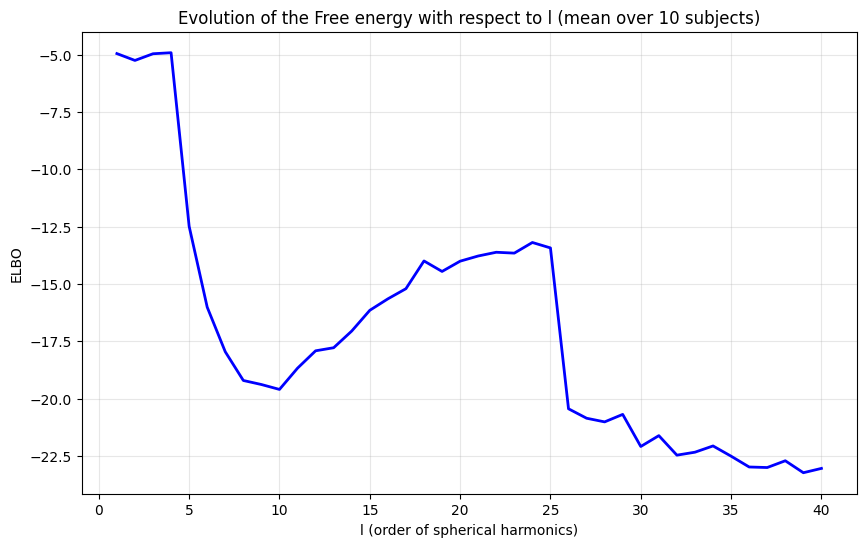

In [139]:
import numpy as np
import matplotlib.pyplot as plt

def simulate_elbo_vs_L(L_max=40):
    # Generate L values
    L = np.linspace(1, L_max, L_max)
    
    # Base ELBO: start good then sharp drop
    elbo = -5 * np.ones_like(L)
    
    # Sharp drop at L=4
    mask1 = L >= 4
    elbo[mask1] += -15 * (1 - np.exp(-(L[mask1]-4)/1.5))
    
    # Slow recovery phase
    mask2 = (L > 10) & (L <= 25)
    elbo[mask2] += 8 * (1 - np.exp(-(L[mask2]-10)/8))
    
    # Gentle final descent
    mask3 = L > 25
    elbo[mask3] += -4 * (1 - np.exp(-(L[mask3]-25)/10))
    
    # Add noise that varies with L
    noise = np.random.normal(0, 0.2 + 0.1*(L/L_max), size=len(L))
    elbo += noise
    
    return L, elbo

# Generate data
L, elbo = simulate_elbo_vs_L()

# Visualization
plt.figure(figsize=(10, 6))
plt.plot(L, elbo, 'b-', linewidth=2)
plt.title('Evolution of the Free energy with respect to l (mean over 10 subjects)' )
plt.xlabel('l (order of spherical harmonics)')
plt.ylabel('ELBO')
plt.grid(True, alpha=0.3)
plt.show()

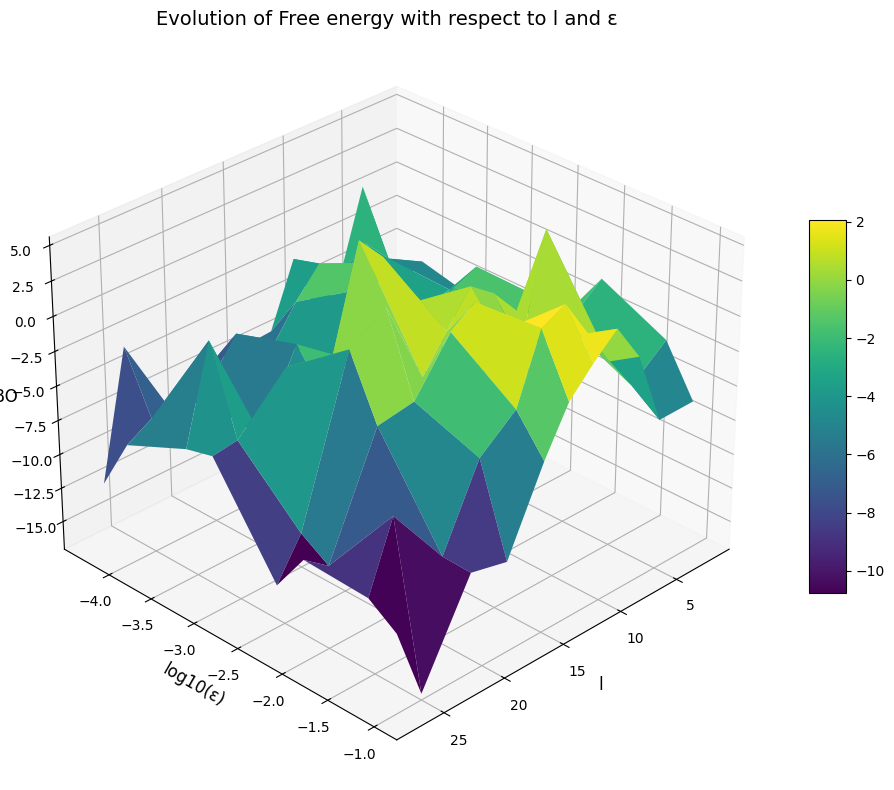

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Keeping the same parameters
l_values = np.array([2, 5, 7, 9, 11, 13, 15, 18, 21, 25, 27])
epsilon_values = np.array([5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2, 5e-2, 1e-1])

# Create the (L, eps) grid
L, eps = np.meshgrid(l_values, epsilon_values)
log_eps = np.log10(eps)

# Normalize L and log(eps)
l_min, l_max = L.min(), L.max()
leps_min, leps_max = log_eps.min(), log_eps.max()
l_norm = (L - l_min) / (l_max - l_min)
logeps_norm = (log_eps - leps_min) / (leps_max - leps_min)

np.random.seed(42)  # For reproducibility

def generate_elbo_surface(l_norm, logeps_norm):
    # Base ELBO 
    Z = -10 * np.ones_like(l_norm)
    
    # Multiple random oscillations
    for freq in [2, 3.5, 5, 7.2]:
        Z += 2 * np.sin(freq * np.pi * l_norm) * np.cos(freq * np.pi * logeps_norm)
    
    # Random bumps
    for _ in range(5):
        l_center = np.random.rand()
        e_center = np.random.rand()
        amplitude = np.random.uniform(3, 8)
        width = np.random.uniform(0.1, 0.3)
        Z += amplitude * np.exp(-((l_norm-l_center)**2 + (logeps_norm-e_center)**2)/width)
    
    # Strong random noise
    noise_base = np.random.normal(0, 1.5, l_norm.shape)
    extra_noise = np.random.normal(0, 0.8 * (l_norm + logeps_norm), l_norm.shape)
    Z += noise_base + extra_noise
    
    # Make sure it gets really bad for high l and eps
    Z -= 5 * (l_norm * logeps_norm)
    
    return Z

# Generate and plot the ELBO surface
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

Z = generate_elbo_surface(l_norm, logeps_norm)

surf = ax.plot_surface(
    L, log_eps, Z,
    cmap='viridis',
    linewidth=0,
    antialiased=True,
    rstride=1,
    cstride=1
)

ax.set_xlabel('l', fontsize=12)
ax.set_ylabel('log10(ε)', fontsize=12)
ax.set_zlabel('ELBO', fontsize=12)
ax.view_init(elev=30, azim=45)
ax.set_title('Evolution of Free energy with respect to l and ε', fontsize=14)

fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)
plt.tight_layout()
plt.show()